In [1]:
from google.colab import drive
from os import chdir
drive.mount('/content/drive/', force_remount=True)
chdir("drive/MyDrive/Colab Notebooks/fairnessWithRegularisation_visualisation")

Mounted at /content/drive/


In [2]:
!pip install --upgrade tenseal

     |████████████████████████████████| 4.9MB 4.3MB/s 


In [ ]:
# General purpose
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import tenseal as ts

%matplotlib inline

# User defined
import datasets as ds
import neuroNets as mnn
import trainUtilities as tu
import cryptUtilities as cu
import scoreUtilities as su

# Crypted Training

## Data Loading

In [ ]:
sensible_attr = "gender_coded"
output_attr = "age_binary30"

biased = '_biased9010'
n = 1000
features = 32
hidden_card = 16
dim_out = 2

tr_set = ds.StoredImageBytesDataset(
    filePath=f"data/datasets/FairFace/FairFace_train_adaptedVGGface_squareDenseNet_reduced25k-{features}({hidden_card}hidden)_noReg{biased}.parquet",
    output_feature=output_attr, sensible_feature=sensible_attr, drop_sensible=(1,.87), reduced=n, vectorise_out=dim_out>1
    )
tr_loader = torch.utils.data.DataLoader(tr_set, batch_size=1, shuffle=True, drop_last=False)

eval_set = ds.StoredImageBytesDataset(
    filePath=f"data/datasets/FairFace/FairFace_test_adaptedVGGface_squareDenseNet_reduced25k-{features}({hidden_card}hidden)_noReg{biased}.parquet",
    output_feature=output_attr, sensible_feature=sensible_attr
    )
ts_loader = torch.utils.data.DataLoader(eval_set, batch_size=len(eval_set), shuffle=True, drop_last=False)

In [ ]:
## Encryption Parameters

poly_mod_degree = 8192
head_scale = 30
bits_scale = 21

train_coeff_mod_bit_sizes = [head_scale, bits_scale, bits_scale, bits_scale, bits_scale, bits_scale, bits_scale, bits_scale, head_scale]

train_data_context = ts.context(ts.SCHEME_TYPE.CKKS,
                                poly_modulus_degree = poly_mod_degree,
                                coeff_mod_bit_sizes = train_coeff_mod_bit_sizes)
# scale of ciphertext to use
train_data_context.global_scale = 2 ** bits_scale
# this key is needed for doing dot-product operations
train_data_context.generate_galois_keys()


# train_net_context = ts.context(ts.SCHEME_TYPE.CKKS,
                            #    poly_modulus_degree = poly_mod_degree,
                            #    coeff_mod_bit_sizes = [40, bits_scale, bits_scale, bits_scale, 40]
                            #    )
# train_net_context.global_scale = pow(2, bits_scale)
# train_net_context.generate_galois_keys()

In [ ]:
encr_data_loader = encrypt_data_loader(
    encryption_context = train_data_context,
    data_loader = tr_loader,
    encrypt_label = True
    )

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:47<00:00,  5.97it/s]


## Training

In [ ]:
start_dnn = EncryptedNN(
    # torch_nn = plain_NN(n_features=feature_red, n_hiddens=hidden_card, vectorise_out=dim_out>1),
    nodes = (features, hidden_card, dim_out),
    final_sigmoid = False, verbose=True,
    )

# start_dnn.save_network(lr='start')

start_dnn.test_evaluation(ts_loader, fairness=True)

(44.9, 5.75)

In [ ]:
s_pre = f"{'balanced' if biased=='' else biased[1:]}Embeddings_biased9010Training/{n}/"

epochs = 5
lr = .02

# for fr in [0,5,10,15,20,40,80]:
for fr in [20,40]:
    model = EncryptedNN(nodes=(features, hidden_card, dim_out), final_sigmoid=False, verbose=True)
    model.load_network(lr=.02, reg=fr, prefix="mine-crypt/"+s_pre)
#     model.load_network(lr="start")

    model.train(
        num_epochs=epochs, train_loader=encr_data_loader, criterion=SquareError(), train_net_context=train_data_context,
        learning_rate=lr, regularisation_strength=fr, plain_ts_loader=ts_loader, fairness_test=True,
        save_prefix=s_pre
        )

    res = model.test_evaluation(ts_loader, fairness=True)
    print(f"\nRegulariser {fr} \nAccuracy: {res[0]}\tDDP: {res[1]}")

  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]


Epoch #0
	Accuracy: 55.1	Unfairness: 0.0


100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [58:21<00:00,  3.50s/it]



Epoch #1
	Train Loss: 0.7672303915023804
	Fair Loss: 0.0016237511299550533



100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [1:11:58<00:00,  4.32s/it]



Epoch #2
	Train Loss: 0.6626505851745605
	Fair Loss: 0.0013313933741301298



100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [58:18<00:00,  3.50s/it]



Epoch #3
	Train Loss: 0.6351221799850464
	Fair Loss: 0.001049123820848763



100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [1:01:06<00:00,  3.67s/it]



Epoch #4
	Train Loss: 0.6179824471473694
	Fair Loss: 0.0008748983382247388



100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [58:21<00:00,  3.50s/it]



Epoch #5
	Train Loss: 0.6070561408996582
	Fair Loss: 0.0007136687636375427


Epoch #5
	Accuracy: 60.06	Unfairness: 2.07

Regulariser 20 
Accuracy: 60.06	DDP: 2.07


  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]


Epoch #0
	Accuracy: 45.44	Unfairness: 5.48


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [1:05:53<00:00,  3.95s/it]



Epoch #1
	Train Loss: 0.8108729720115662
	Fair Loss: 0.00018201983766630292



100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [57:39<00:00,  3.46s/it]



Epoch #2
	Train Loss: 0.9424352049827576
	Fair Loss: 0.0007499899948015809



100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [1:03:49<00:00,  3.83s/it]



Epoch #3
	Train Loss: 0.760330855846405
	Fair Loss: 0.0002133573143510148



100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [58:22<00:00,  3.50s/it]



Epoch #4
	Train Loss: 0.581637978553772
	Fair Loss: 0.0004401716578286141



100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [58:17<00:00,  3.50s/it]



Epoch #5
	Train Loss: 0.5742873549461365
	Fair Loss: 0.0003571751294657588


Epoch #5
	Accuracy: 71.49	Unfairness: 6.02

Regulariser 40 
Accuracy: 71.49	DDP: 6.02


# Plain Training

## Data Loading

In [ ]:
sensible_attr = "gender_coded"
output_attr = "age_binary30"

biased = '_biased9010'
n = 1000
features = 32
hidden_card = 16
dim_out = 2

tr_set = ds.StoredImageBytesDataset(
    filePath=f"data/datasets/FairFace/FairFace_train_adaptedVGGface_squareDenseNet_reduced25k-{features}({hidden_card}hidden)_noReg{biased}.parquet",
    output_feature=output_attr, sensible_feature=sensible_attr, drop_sensible=(1,.87), reduced=n, vectorise_out=dim_out>1
    )
tr_loader = torch.utils.data.DataLoader(tr_set, batch_size=n, shuffle=True, drop_last=False)

eval_set = ds.StoredImageBytesDataset(
    filePath=f"data/datasets/FairFace/FairFace_test_adaptedVGGface_squareDenseNet_reduced25k-{features}({hidden_card}hidden)_noReg{biased}.parquet",
    output_feature=output_attr, sensible_feature=sensible_attr
    )
ts_loader = torch.utils.data.DataLoader(eval_set, batch_size=len(eval_set), shuffle=True, drop_last=False)

## Training

In [ ]:
start_dnn = EncryptedNN(
    # torch_nn = plain_NN(n_features=feature_red, n_hiddens=hidden_card, vectorise_out=dim_out>1),
    nodes = (features, hidden_card, dim_out),
    final_sigmoid = False, verbose=True,
    )

start_dnn.save_network(lr='start')

start_dnn.test_evaluation(ts_loader, fairness=True)

(44.9, 5.75)

In [ ]:
s_pre = f"{'balanced' if biased=='' else biased[1:]}Embeddings_biased9010Training/{n}/"

epochs = 20
lr = .05

for fr in [1]: # [0,5,10,15,20,40,80]:
    model = cu.EncryptedNN(nodes=(features, hidden_card, dim_out), final_sigmoid=False, verbose=True)
    model.load_network(lr='start')

    model.train(
        num_epochs=epochs, train_loader=tr_loader, criterion=cu.SquareError(), train_net_context=None,
        learning_rate=lr, regularisation_strength=fr, plain_ts_loader=ts_loader, fairness_test=True,
        save_prefix=s_pre
        )

    res = model.test_evaluation(ts_loader, fairness=True)
    print(f"\nRegulariser {fr} \nAccuracy: {res[0]}\tDDP: {res[1]}")

  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #0
	Accuracy: 55.1	Unfairness: 0.0


100%|██████████| 1/1 [00:00<00:00,  2.93it/s]



Epoch #1
	Train Loss: 0.9210874438285828
	Fair Loss: 0.0023296347353607416



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #2
	Train Loss: 0.7266760468482971
	Fair Loss: 0.002276818733662367



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #3
	Train Loss: 0.6083067655563354
	Fair Loss: 0.002276207087561488



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #4
	Train Loss: 0.5331441760063171
	Fair Loss: 0.002292283810675144



100%|██████████| 1/1 [00:00<00:00,  3.03it/s]



Epoch #5
	Train Loss: 0.4949992299079895
	Fair Loss: 0.0023101456463336945



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #5
	Accuracy: 74.41	Unfairness: 12.11


  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #6
	Train Loss: 0.480259507894516
	Fair Loss: 0.0023224852047860622



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #7
	Train Loss: 0.47471997141838074
	Fair Loss: 0.0023293655831366777



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #8
	Train Loss: 0.4715246260166168
	Fair Loss: 0.0023342783097177744



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #9
	Train Loss: 0.4687822163105011
	Fair Loss: 0.0023399891797453165



100%|██████████| 1/1 [00:00<00:00,  2.21it/s]



Epoch #10
	Train Loss: 0.4661017656326294
	Fair Loss: 0.002347787609323859



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #10
	Accuracy: 66.73	Unfairness: 7.32


  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #11
	Train Loss: 0.4633997678756714
	Fair Loss: 0.0023581250570714474



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #12
	Train Loss: 0.46065258979797363
	Fair Loss: 0.0023711202666163445



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #13
	Train Loss: 0.4578501284122467
	Fair Loss: 0.0023868014104664326



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #14
	Train Loss: 0.4549863040447235
	Fair Loss: 0.00240515754558146



100%|██████████| 1/1 [00:00<00:00,  3.09it/s]



Epoch #15
	Train Loss: 0.4520564079284668
	Fair Loss: 0.002426177030429244



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #15
	Accuracy: 70.39	Unfairness: 8.92


  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #16
	Train Loss: 0.44905614852905273
	Fair Loss: 0.0024498645216226578



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #17
	Train Loss: 0.44598203897476196
	Fair Loss: 0.002476203255355358



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #18
	Train Loss: 0.44283047318458557
	Fair Loss: 0.0025052037090063095



  0%|          | 0/1 [00:00<?, ?it/s]


Epoch #19
	Train Loss: 0.43959853053092957
	Fair Loss: 0.002536860993131995



100%|██████████| 1/1 [00:00<00:00,  3.04it/s]



Epoch #20
	Train Loss: 0.4362833797931671
	Fair Loss: 0.002571183955296874


Epoch #20
	Accuracy: 73.92	Unfairness: 10.53

Regulariser 1 
Accuracy: 73.92	DDP: 10.53


# Accuracy-Fairness Plots

In [4]:
import matplotlib.pyplot as plt
import cryptUtilities as cu
import numpy as np

%matplotlib inline

def plots_results(test_loader, network_dim, network_prefix, regularisations=[0], learning_rate=.05):
    plt.figure(figsize=(7,5))

    results = []
#     for reg in [0,5,10,15,16,17,18,20]:
    for reg in regularisations:
        model = cu.EncryptedNN(nodes=(network_dim['features'], network_dim["hidden_card"], network_dim["dim_out"]), final_sigmoid=False, verbose=False)
        model.load_network(lr=learning_rate, reg=reg, prefix=network_prefix)

        results.append((reg, model.test_evaluation(test_loader=test_loader, fairness=True)))

    line = []
    for reg, (acc, fair) in results:
        plt.scatter(acc, fair, label=reg)
        line.append((acc,fair))


    plt.plot(*np.array(line).T, ls='dashed', color='gray')

    plt.legend(title="$\lambda$", ncol=2, fontsize=14, title_fontsize=14)
    plt.grid(True)
    plt.xlabel('ACC', fontsize=16); plt.ylabel('DDP', fontsize=16)
    plt.yticks(fontsize=14); plt.xticks(fontsize=14)
    plt.title(f"Proposed {'crypted' if network_prefix.split('-')[1].split('/')[0]=='crypt' else 'plain'} architecture", fontsize=19, pad=10)


In [ ]:
import datasets as ds
import torch

n_dim = {
    "features": 32,
    "hidden_card": 16,
    "dim_out": 2,
}

sensible_attr = "gender_coded"
output_attr = "age_binary30"

b_eval_set = ds.StoredImageBytesDataset(
    filePath=f"data/datasets/FairFace/FairFace_test_adaptedVGGface_squareDenseNet_reduced25k-{n_dim['features']}({n_dim['hidden_card']}hidden)_noReg_biased9010.parquet",
    output_feature=output_attr, sensible_feature=sensible_attr)
biased_ts_loader = torch.utils.data.DataLoader(b_eval_set, batch_size=len(b_eval_set), shuffle=True, drop_last=False)

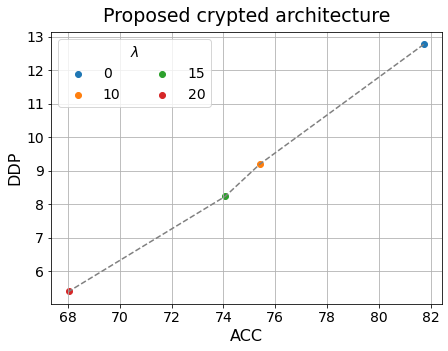

In [ ]:
# 32-16, biased embeddings, biased train
pre = "mine-crypt/biased9010Embeddings_biased9010Training/1000/"

plots_results(test_loader=biased_ts_loader, network_dim=n_dim, network_prefix=pre,
              regularisations=[0,10,15,20], learning_rate=.02)

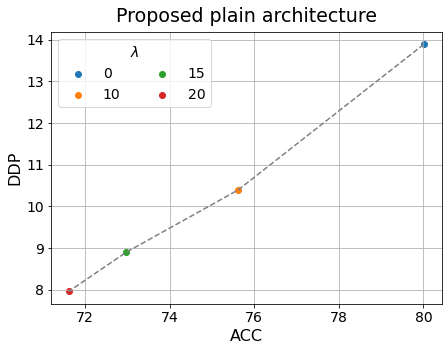

In [ ]:
# 32-16, biased embeddings, biased train
pre = "mine-plain/biased9010Embeddings_biased9010Training/1000/"

plots_results(test_loader=biased_ts_loader, network_dim=n_dim, network_prefix=pre,
              regularisations=[0,10,15,20], learning_rate=.05)

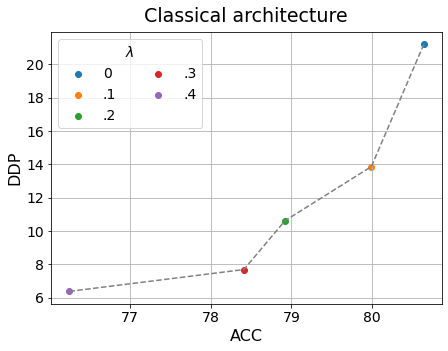

In [8]:
import torch

plt.figure(figsize=(7,5))


res = torch.load("checkpoint/sex/accuracyFairness-tradeoff/vggface_noReg/adapted_vggface_ck10.tar")["average_validLoss"]

plot_res = []
plot_res.append((0,res[0,0],res[0,-1]))
for reg in [1,2,3,4]:
    res = torch.load(f"checkpoint/sex/accuracyFairness-tradeoff/regularised/vggface_FOM_layer=0_lambda=d{reg}/adapted_vggface_ck10.tar")["average_validLoss"]
    plot_res.append((reg, res[0,0], res[0,-1]))

plot_res

line = []
for reg, acc, fair in plot_res:
    plt.scatter(acc, fair, label=f"{'.' if reg!=0 else ''}{reg}")
    line.append((acc,fair))
plt.plot(*np.array(line).T, ls='dashed', color='gray')

plt.legend(title="$\lambda$", ncol=2, fontsize=14, title_fontsize=14)
plt.grid(True)

plt.xlabel('ACC', fontsize=16); plt.ylabel('DDP', fontsize=16)
plt.yticks(fontsize=14); plt.xticks(fontsize=14)

plt.title(f"Classical architecture", fontsize=19, pad=10);

# Attention Maps

In [ ]:
# General purpose
import numpy as np
import matplotlib.pyplot as plt
import torch
import pandas as pd

%matplotlib inline

# User defined
import datasets as ds
import cryptUtilities as cu
import camModels as cm
import plotUtilities as pu

## Data Loading

In [ ]:
# from PIL import Image               # python imaging library

sensible_attr = "annotation-gender[-1,0,1]"     # Sensible feature: gender {0:male, 1:female} (exact name of the dataset column)
output_attr = "annotation-age-bin30[-1,0,1]"    # Binary classification (exact name of the dataset column)
fixed_size, ch = np.array([250, 224]), 3        # Dataset images size and image channels (RGB)
reduced = 0     # Dataset size reduction: {0: do not reduce,
                #                          int>0: reduce to the selected size randomly

In [ ]:
ts_set = ds.StoredImageBytesDataset(
    filePath="data/datasets/DiF/DiF_test_frontalCleaned.parquet",
    output_feature=output_attr,
    sensible_feature=sensible_attr,
    reduced=reduced
    )

## Single Visualisation

In [ ]:
use_cuda = True     # enables computations over GPU
t_device = torch.device("cuda" if use_cuda and torch.cuda.is_available() else "cpu")

In [ ]:
# network parameters

# network input/output dimension (output can be 1 if required by task and loss function)
dim_in, dim_out = np.multiply(*fixed_size)*ch, len(ts_set.output_normMapping.keys()) #1
feature_red = 32
hidden_card = 16

pretrained = True               # Use a pretrained version
embedd_active_grad = False      # Deactivate gradient propagation inside the convolution layers (referred to as "features")
sigm_activ = False              # Dense layer activation function: {True: sigmoid, False: square}
                               
model_name = "vggface"          # Model name: "alexnet","vgg11","vgg13","vgg16","vgg19","vggface","resnet50","inceptionresnet"
hiddens = [hidden_card]         # Fully connected layers depth and width: 
                                # e.g. [100,10] means features -> 100 neurons -> 10 neurons -> output dim

# Classification model
ft_model = cu.Adapted_fullyConn_classifier(
    dim_out=dim_out, hiddens=hiddens, model_name=model_name,
    req_grad=embedd_active_grad,
    pretrained=pretrained, sigm_activ=sigm_activ,
    feature_reduction=feature_red).to(t_device)

ft_model    # print model recap

ft_model.load_neuralNet_full(
    torch_device=t_device,
    name_extension='_squareDenseNet_reduced25k-32(16hidden)_noReg_biased9010',
    root_folder='featureExtraction_models/fairfaceEmbedding_extraction/').load_finalLayers(
        reg=15,
        lr=.02,
        torch_device=t_device,
        folder='crypt')

Adapted_fullyConn_classifier(
  (features): Sequential(
    (0): Vgg_face_ft(
      (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1_1): ReLU(inplace=True)
      (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu1_2): ReLU(inplace=True)
      (pool1): MaxPool2d(kernel_size=[2, 2], stride=[2, 2], padding=0, dilation=1, ceil_mode=False)
      (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2_1): ReLU(inplace=True)
      (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu2_2): ReLU(inplace=True)
      (pool2): MaxPool2d(kernel_size=[2, 2], stride=[2, 2], padding=0, dilation=1, ceil_mode=False)
      (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu3_1): ReLU(inplace=True)
      (conv3_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu3_2): ReLU(inplace=True)
  

In [ ]:
model_dict = {"arch":ft_model, "layer_name":"features.0.conv5_3"}
grad_cam = cm.GradCAM_wrapper(model_dict=model_dict)

### Random

(0, 1)

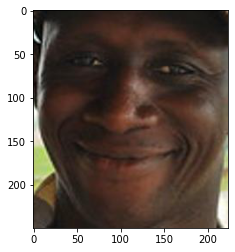

In [ ]:
(root_img, gender), label = ts_set[int(np.random.random()*len(ts_set))]
gender, label = gender.item(), label.item()

numpy_img = np.uint8(255*root_img.permute(1,2,0).numpy())
plt.imshow(numpy_img)
gender, label

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


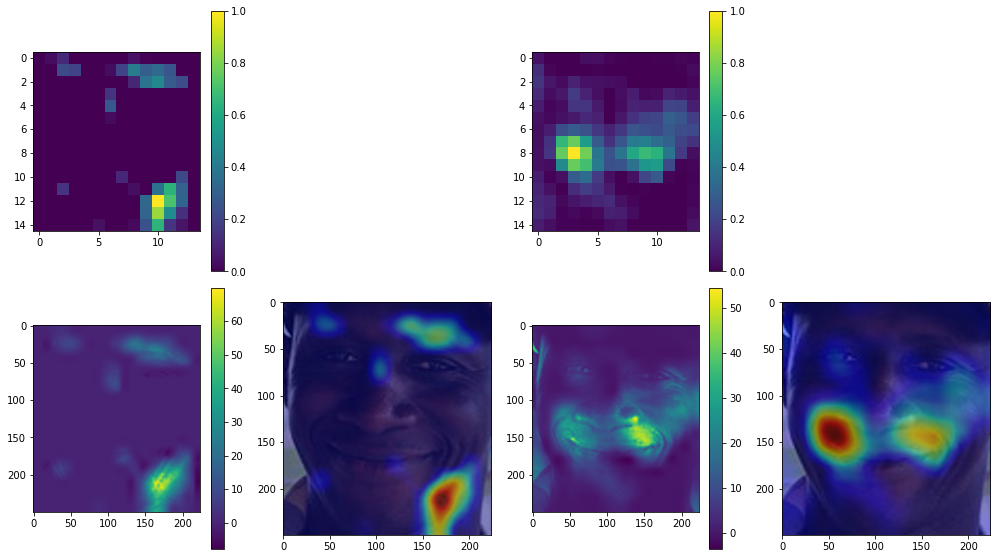

In [ ]:
pu.plot_cams(grad_cam, root_img.unsqueeze(0).to(t_device), class_idxs=[0,1])

### Specific

(1, 0)

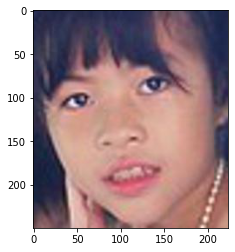

In [ ]:
# annotation-gender[-1,0,1] annotation-age-bin30[-1,0,1] annotation-age[-1,0-100]>60
# gender_coded age_coded

# male, young: 114503, 24332
# filter = (ts_set.full_ds["annotation-gender[-1,0,1]"]==0)&(ts_set.full_ds["annotation-age[-1,0-100]"]<15)&(ts_set.full_ds["annotation-age[-1,0-100]"]>5)
# female, young: 213905, 57927
filter = (ts_set.full_ds["annotation-gender[-1,0,1]"]==1)&(ts_set.full_ds["annotation-age[-1,0-100]"]<15)&(ts_set.full_ds["annotation-age[-1,0-100]"]>5)
# male, old: 219944, 4994
# filter = (ts_set.full_ds["annotation-gender[-1,0,1]"]==0)&(ts_set.full_ds["annotation-age[-1,0-100]"]>60)
# female, old: 177837, 24059
# filter = (ts_set.full_ds["annotation-gender[-1,0,1]"]==1)&(ts_set.full_ds["annotation-age[-1,0-100]"]<60)

row = ts_set.full_ds.iloc[np.random.choice(np.where(filter)[0], size=1)]
index, root_img, gender, age = row.iloc[0].name, transforms.ToTensor()(Image.open(BytesIO(row["image_bytes"].iloc[0]))), row["annotation-gender[-1,0,1]"].iloc[0], row["annotation-age-bin30[-1,0,1]"].iloc[0]

numpy_img = np.uint8(255*root_img.permute(1,2,0).numpy())
plt.imshow(numpy_img)
gender, age

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


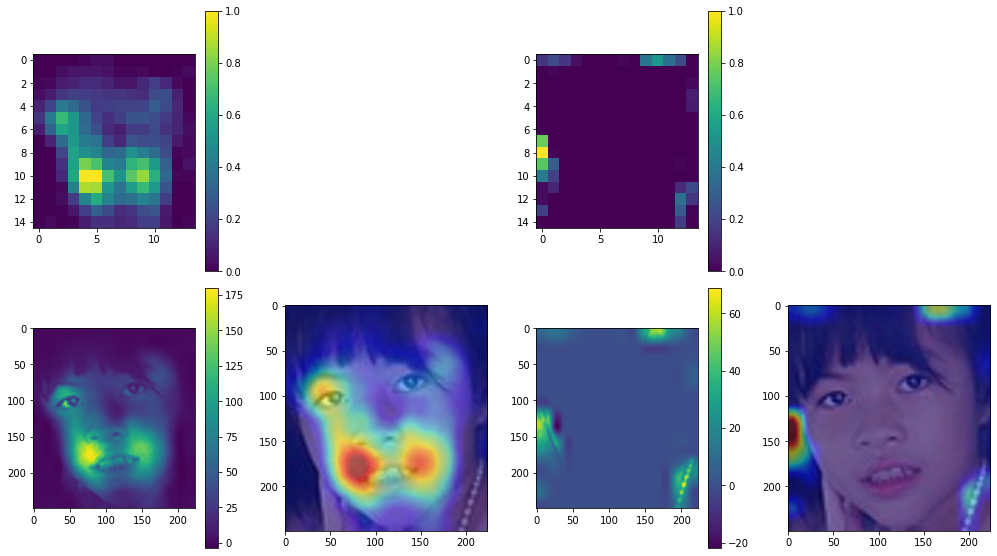

In [ ]:
pu.plot_cams(grad_cam, root_img.unsqueeze(0).to(t_device), class_idxs=[0,1])

### Picked Examples

In [ ]:
def classSensitive_examples(face00, face01, face10, face11, noReg_cam, reg_cam, reg=0):
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(14,12))
    plt.setp(axes, xticks=[], yticks=[])
    for idx, face in enumerate([face00, face01, face10, face11]):
        numpy_face = np.uint8(255*face.permute(0,2,3,1).cpu().numpy().squeeze())
        axes[0,idx].set_title(f"{'Old' if idx<2 else 'Young'} {'Female' if idx%2==0 else 'Male'}", fontsize=25)
        axes[0,idx].imshow(numpy_face)
        axes[1,idx].imshow(pu.grayscale_heatmap(numpy_face, noReg_cam(face)).squeeze())
        axes[2,idx].imshow(pu.grayscale_heatmap(numpy_face, reg_cam(face)).squeeze())

        if idx==0:
            axes[0,idx].text(-20,120,"Original Face",rotation=90,fontsize=25,ha="center",va="center")
            axes[1,idx].text(-20,120,"$\lambda=0$",rotation=90,fontsize=25,ha="center",va="center")
            axes[2,idx].text(-20,120,f"$\lambda={reg}$",rotation=90,fontsize=25,ha="center",va="center")

In [ ]:
# young male
df = ts_set.full_ds.loc[(ts_set.full_ds["annotation-age[-1,0-100]"]<20) & (ts_set.full_ds["annotation-gender[-1,0,1]"]==0)]
# young female
# df = ts_set.full_ds.loc[(ts_set.full_ds["annotation-age[-1,0-100]"]<20) & (ts_set.full_ds["annotation-gender[-1,0,1]"]==1)]
# old male
# df = ts_set.full_ds.loc[(ts_set.full_ds["annotation-age[-1,0-100]"]>45) & (ts_set.full_ds["annotation-gender[-1,0,1]"]==0)]
# old female
# df = ts_set.full_ds.loc[(ts_set.full_ds["annotation-age[-1,0-100]"]>45) & (ts_set.full_ds["annotation-gender[-1,0,1]"]==1)]

i = 0

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


4.2312393
1315 86498


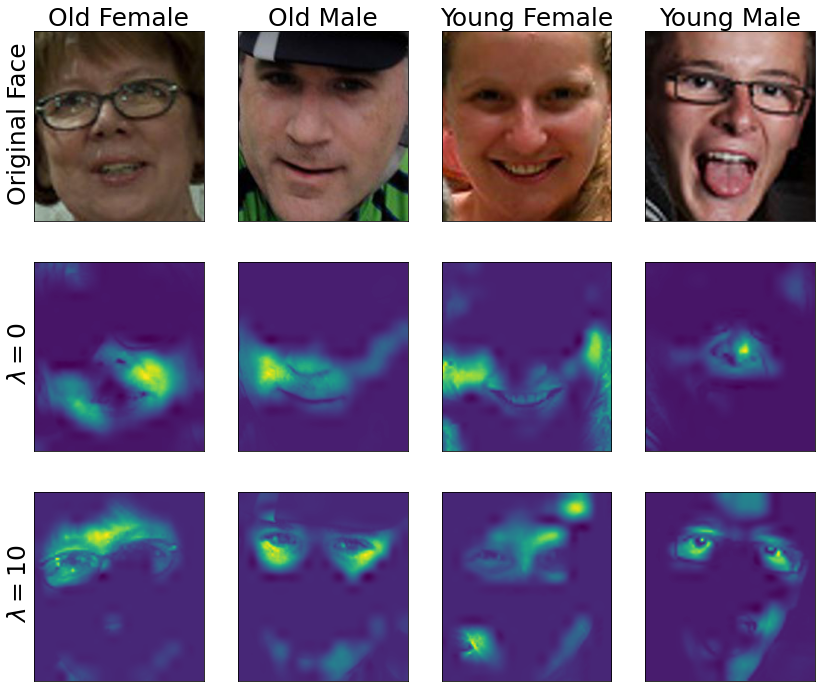

In [ ]:
from torchvision import transforms
from PIL import Image
from io import BytesIO

for i in range(i+1, len(df)):
    img = transforms.ToTensor()(Image.open(BytesIO(df.iloc[i]["image_bytes"]))).unsqueeze(0).to(t_device)

    if np.linalg.norm(r_gcam(img)-nr_gcam(img))>3:
        print(np.linalg.norm(r_gcam(img)-nr_gcam(img)))
        print(i, df.iloc[i].name)
        break

male_n = transforms.ToTensor()(Image.open(BytesIO(df.iloc[i]["image_bytes"]))).unsqueeze(0).to(t_device)

classSensitive_examples(female_p, male_p, female_n, male_n, nr_gcam, r_gcam, reg=10)

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


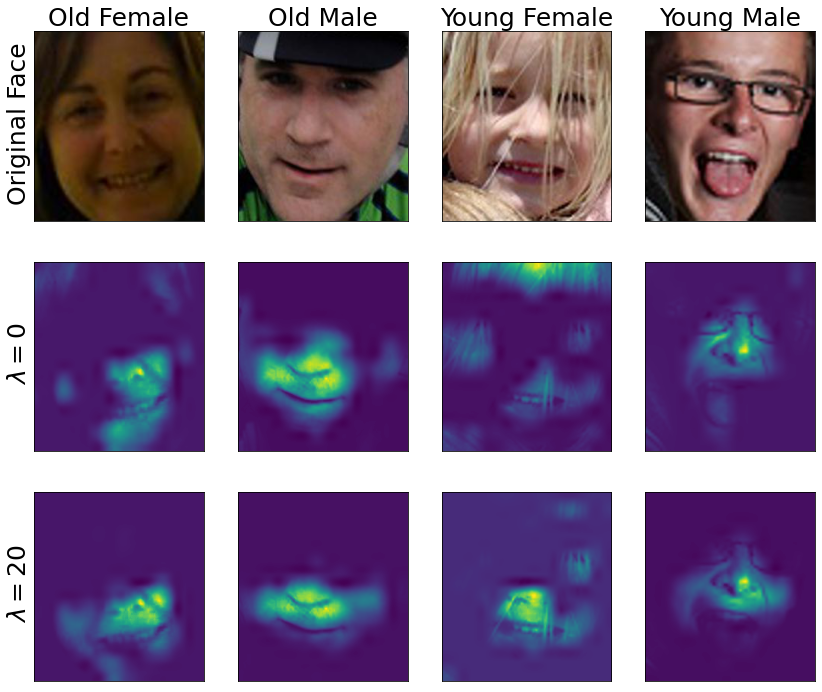

In [ ]:
from torchvision import transforms
from io import BytesIO
from PIL import Image

# lambda=20
# ym = 141668, 174833, 191522, 74841, 159970, 227818, 232668
# yf = 10778
# om = 14951, 97008, 146321
# of = 120837, 

# lambda=10
# ym = 203027, 35860, 61782, 229362, 86498
# yf = 130681, 226347, 232827, 23108
# om = 120243
# of = 101128, 36023


# male_p = transforms.ToTensor()(Image.open(BytesIO(ts_set.full_ds.loc[219944]["image_bytes"]))).unsqueeze(0).to(t_device)
# male_n = transforms.ToTensor()(Image.open(BytesIO(ts_set.full_ds.loc[114503]["image_bytes"]))).unsqueeze(0).to(t_device)
# female_p = transforms.ToTensor()(Image.open(BytesIO(ts_set.full_ds.loc[24059]["image_bytes"]))).unsqueeze(0).to(t_device)
# female_n = transforms.ToTensor()(Image.open(BytesIO(ts_set.full_ds.loc[213905]["image_bytes"]))).unsqueeze(0).to(t_device)

# ym = ts_set.full_ds.loc[(ts_set.full_ds["annotation-age[-1,0-100]"]<10) & (ts_set.full_ds["annotation-gender[-1,0,1]"]==0)].sample().index[0]
# om = ts_set.full_ds.loc[(ts_set.full_ds["annotation-age[-1,0-100]"]>40) & (ts_set.full_ds["annotation-gender[-1,0,1]"]==0)].sample().index[0]
# yf = ts_set.full_ds.loc[(ts_set.full_ds["annotation-age[-1,0-100]"]<10) & (ts_set.full_ds["annotation-gender[-1,0,1]"]==1)].sample().index[0]
# of = ts_set.full_ds.loc[(ts_set.full_ds["annotation-age[-1,0-100]"]>40) & (ts_set.full_ds["annotation-gender[-1,0,1]"]==1)].sample().index[0]

ym = 86498
yf = 23108
om = 120243
of = 101128

male_p = transforms.ToTensor()(Image.open(BytesIO(ts_set.full_ds.loc[om]["image_bytes"]))).unsqueeze(0).to(t_device)
male_n = transforms.ToTensor()(Image.open(BytesIO(ts_set.full_ds.loc[ym]["image_bytes"]))).unsqueeze(0).to(t_device)
female_p = transforms.ToTensor()(Image.open(BytesIO(ts_set.full_ds.loc[of]["image_bytes"]))).unsqueeze(0).to(t_device)
female_n = transforms.ToTensor()(Image.open(BytesIO(ts_set.full_ds.loc[yf]["image_bytes"]))).unsqueeze(0).to(t_device)

classSensitive_examples(female_p, male_p, female_n, male_n, nr_gcam, r_gcam, reg=20)

In [ ]:
# network parameters

# network input/output dimension (output can be 1 if required by task and loss function)
dim_in, dim_out = np.multiply(*fixed_size)*ch, len(ts_set.output_normMapping.keys()) #1
feature_red = 32
hidden_card = 16

pretrained = True               # Use a pretrained version
embedd_active_grad = False      # Deactivate gradient propagation inside the convolution layers (referred to as "features")
sigm_activ = False              # Dense layer activation function: {True: sigmoid, False: square}
                               
model_name = "vggface"          # Model name: "alexnet","vgg11","vgg13","vgg16","vgg19","vggface","resnet50","inceptionresnet"
hiddens = [hidden_card]         # Fully connected layers depth and width: 
                                # e.g. [100,10] means features -> 100 neurons -> 10 neurons -> output dim

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


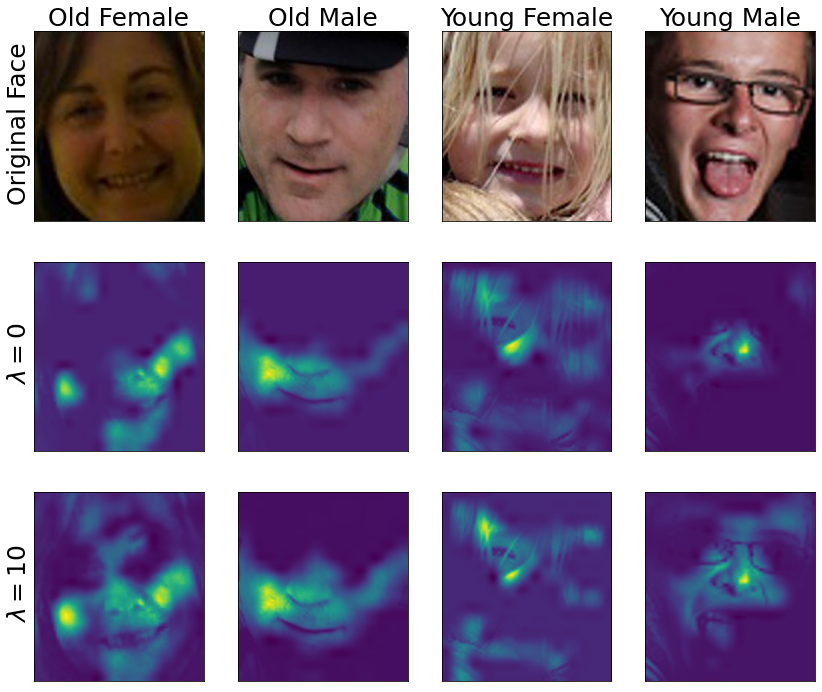

In [ ]:
########## PLAIN

model = cu.Adapted_fullyConn_classifier(
    dim_out=dim_out, hiddens=hiddens, model_name=model_name,
    req_grad=embedd_active_grad,
    pretrained=pretrained, sigm_activ=sigm_activ,
    feature_reduction=feature_red).to(t_device)
model.load_neuralNet_full(
    torch_device=t_device,
    name_extension='_squareDenseNet_reduced25k-32(16hidden)_noReg_biased9010',
    root_folder='featureExtraction_models/fairfaceEmbedding_extraction/').load_finalLayers(
        reg=0,
        lr=.05,
        torch_device=t_device,
        folder='plain')
model_dict = {"arch":model, "layer_name":"features.0.conv5_3"}
nr_gcam = cm.GradCAM_wrapper(model_dict=model_dict)

model = cu.Adapted_fullyConn_classifier(
    dim_out=dim_out, hiddens=hiddens, model_name=model_name,
    req_grad=embedd_active_grad,
    pretrained=pretrained, sigm_activ=sigm_activ,
    feature_reduction=feature_red).to(t_device)
model.load_neuralNet_full(
    torch_device=t_device,
    name_extension='_squareDenseNet_reduced25k-32(16hidden)_noReg_biased9010',
    root_folder='featureExtraction_models/fairfaceEmbedding_extraction/').load_finalLayers(
        reg=10,
        lr=.05,
        torch_device=t_device,
        folder='plain')
model_dict = {"arch":model, "layer_name":"features.0.conv5_3"}
r_gcam = cm.GradCAM_wrapper(model_dict=model_dict)

classSensitive_examples(female_p, male_p, female_n, male_n, nr_gcam, r_gcam, reg=10)

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


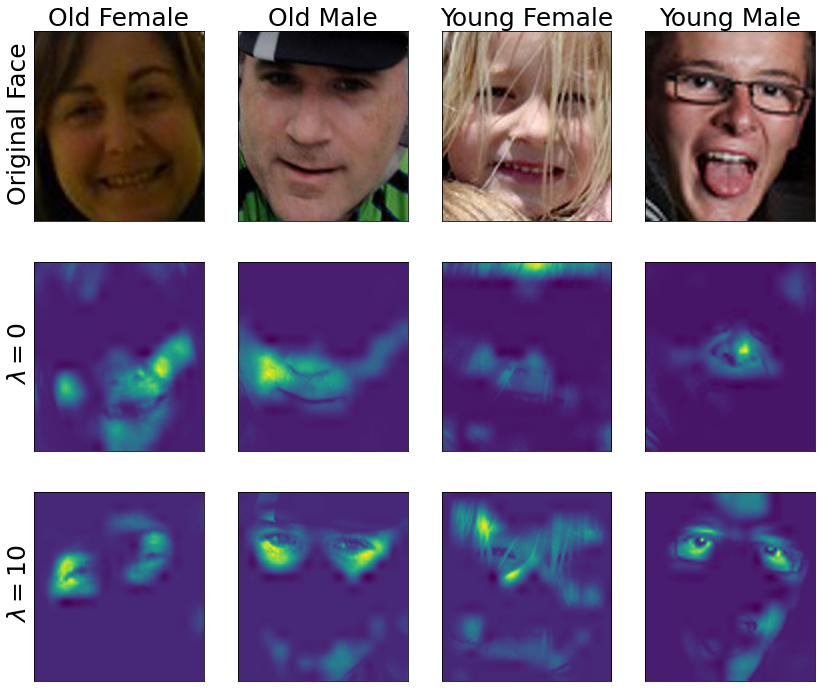

In [ ]:
########## CRYPT

model = cu.Adapted_fullyConn_classifier(
    dim_out=dim_out, hiddens=hiddens, model_name=model_name,
    req_grad=embedd_active_grad,
    pretrained=pretrained, sigm_activ=sigm_activ,
    feature_reduction=feature_red).to(t_device)
model.load_neuralNet_full(
    torch_device=t_device,
    name_extension='_squareDenseNet_reduced25k-32(16hidden)_noReg_biased9010',
    root_folder='featureExtraction_models/fairfaceEmbedding_extraction/').load_finalLayers(
        reg=0,
        lr=.02,
        torch_device=t_device,
        folder='crypt')
model_dict = {"arch":model, "layer_name":"features.0.conv5_3"}
nr_gcam = cm.GradCAM_wrapper(model_dict=model_dict)

model = cu.Adapted_fullyConn_classifier(
    dim_out=dim_out, hiddens=hiddens, model_name=model_name,
    req_grad=embedd_active_grad,
    pretrained=pretrained, sigm_activ=sigm_activ,
    feature_reduction=feature_red).to(t_device)
model.load_neuralNet_full(
    torch_device=t_device,
    name_extension='_squareDenseNet_reduced25k-32(16hidden)_noReg_biased9010',
    root_folder='featureExtraction_models/fairfaceEmbedding_extraction/').load_finalLayers(
        reg=10,
        lr=.02,
        torch_device=t_device,
        folder='crypt')
model_dict = {"arch":model, "layer_name":"features.0.conv5_3"}
r_gcam = cm.GradCAM_wrapper(model_dict=model_dict)

classSensitive_examples(female_p, male_p, female_n, male_n, nr_gcam, r_gcam, reg=10)

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


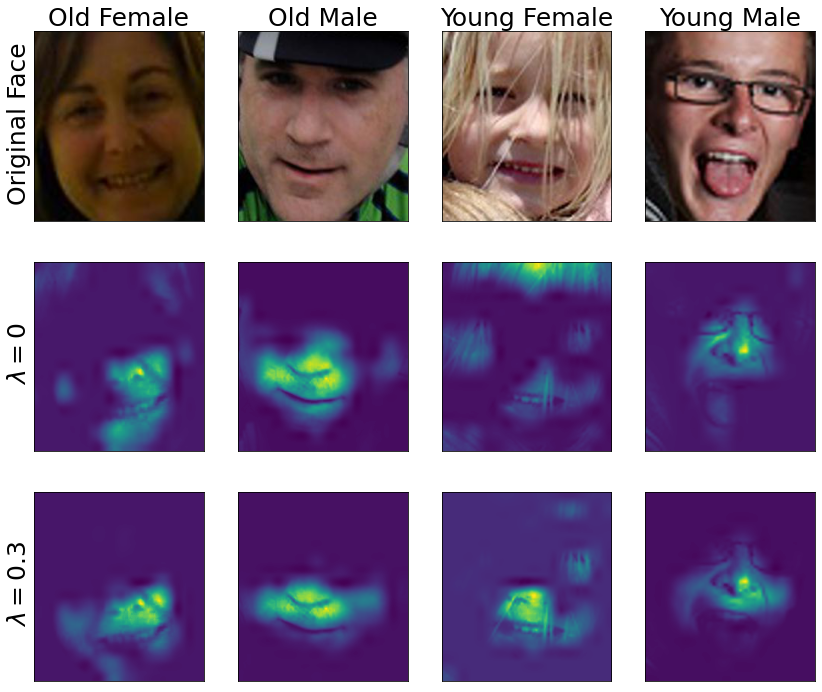

In [ ]:
import neuroNets as mnn
# network parameters

# network input/output dimension (output can be 1 if required by task and loss function)
dim_out = len(ts_set.output_normMapping.keys()) #1

pretrained = False               # Use a pretrained version
embedd_active_grad = False      # Deactivate gradient propagation inside the convolution layers (referred to as "features")
sigm_activ = True               # Dense layer activation function: {True: sigmoid, False: tanh}
                                # note that for a multiclass task (output dimension > 1) the algorithm forces 
                                # the Sigmoid activation (class probabilities)
model_name = "vggface"          # Model name: "alexnet","vgg11","vgg13","vgg16","vgg19","vggface","resnet50","inceptionresnet"
hiddens = [100]                 # Fully connected layers depth and width: 
                                # e.g. [100,10] means features -> 100 neurons -> 10 neurons -> output dim
multiGPU = False                # Enables multi gpu computation for the feature extraction layers


########## CLASSICAl

ext = "_noReg"
model = mnn.Adapted_fullyConn_classifier(dim_out=dim_out, hiddens=hiddens, model_name=model_name, req_grad=embedd_active_grad,
                                         pretrained=pretrained, sigm_activ=sigm_activ, multiGPU=multiGPU).to(t_device)
model.load_neuralNet_full(torch_device=t_device, name_extension=ext, root_folder="sex/")
model_dict = {"arch":model, "layer_name":"features.0.conv5_3"}
nr_gcam = cm.GradCAM_wrapper(model_dict=model_dict)

ext = "_FOM_layer=0_lambda=d3"
model = mnn.Adapted_fullyConn_classifier(dim_out=dim_out, hiddens=hiddens, model_name=model_name, req_grad=embedd_active_grad,
                                         pretrained=pretrained, sigm_activ=sigm_activ, multiGPU=multiGPU).to(t_device)
model.load_neuralNet_full(torch_device=t_device, name_extension=ext, root_folder="sex/")
model_dict = {"arch":model, "layer_name":"features.0.conv5_3"}
r_gcam = cm.GradCAM_wrapper(model_dict=model_dict)

classSensitive_examples(female_p, male_p, female_n, male_n, nr_gcam, r_gcam, reg=.3)

## Compare Settings

In [ ]:
############ CLASSICAL ARCHITECTURES
import neuroNets as mnn

use_cuda = True
t_device = torch.device("cuda" if use_cuda and torch.cuda.is_available() else "cpu")

dim_out = len(ts_set.output_normMapping.keys())
pretrained = False              # Use a pretrained version
embedd_active_grad = False      # Deactivate gradient propagation inside the convolution layers (referred to as "features")
sigm_activ = True               # Dense layer activation function: {True: sigmoid, False: tanh}
                                # note that for a multiclass task (output dimension > 1) the algorithm forces 
                                # the Sigmoid activation (class probabilities)
model_name = "vggface"          # Model name: "alexnet","vgg11","vgg13","vgg16","vgg19","vggface","resnet50","inceptionresnet"
hiddens = [100]                 # Fully connected layers depth and width: 
                                # e.g. [100,10] means features -> 100 neurons -> 10 neurons -> output dim
multiGPU = False                # Enables multi gpu computation for the feature extraction layers

model = mnn.Adapted_fullyConn_classifier(dim_out=dim_out, hiddens=hiddens, model_name=model_name, req_grad=embedd_active_grad,
                                         pretrained=pretrained, sigm_activ=sigm_activ, multiGPU=multiGPU).to(t_device)

layer_name = "features.0.conv5_3"

folder = 'classical'

reg = "d4"

model_dict = {"arch":model.load_neuralNet_full(torch_device=t_device, root_folder="sex/",
                                                # name_extension="_noReg"),
                                                name_extension=f"_FOM_layer=0_lambda={reg}"),
              "layer_name":layer_name}

modelCAM = cm.GradCAM_wrapper(model_dict=model_dict)

models_dict = {
    # "FOM_layer:convolution_lambda=0": modelCAM,
    f"FOM_layer:convolution_lambda={reg}": modelCAM,
    }

In [ ]:
############ NEW ARCHITECTURES

use_cuda = True
t_device = torch.device("cuda" if use_cuda and torch.cuda.is_available() else "cpu")

dim_out = len(ts_set.output_normMapping.keys()) #1
feature_red = 32
hidden_card = 16

pretrained = True               # Use a pretrained version
embedd_active_grad = False      # Deactivate gradient propagation inside the convolution layers (referred to as "features")
sigm_activ = False              # Dense layer activation function: {True: sigmoid, False: square}
                               
model_name = "vggface"          # Model name: "alexnet","vgg11","vgg13","vgg16","vgg19","vggface","resnet50","inceptionresnet"
hiddens = [hidden_card]         # Fully connected layers depth and width: 
                                # e.g. [100,10] means features -> 100 neurons -> 10 neurons -> output dim

model = cu.Adapted_fullyConn_classifier(
    dim_out=dim_out, hiddens=hiddens, model_name=model_name,
    req_grad=embedd_active_grad,
    pretrained=pretrained, sigm_activ=sigm_activ,
    feature_reduction=feature_red).to(t_device)

layer_name = "features.0.conv5_3"

folder = 'plain'
lr = .05
reg = 20

model_dict = {
    "arch":model.load_neuralNet_full(
        torch_device=t_device,
        name_extension='_squareDenseNet_reduced25k-32(16hidden)_noReg_biased9010',
        root_folder='featureExtraction_models/fairfaceEmbedding_extraction/').load_finalLayers(
            reg=reg,
            lr=lr,
            torch_device=t_device,
            folder=folder),
    "layer_name":layer_name}
model_gCAM = cm.GradCAM_wrapper(model_dict=model_dict)


models_dict = {
    f"lambda={reg}":model_gCAM
    }

### Store

In [ ]:
from tqdm import tqdm
import scoreUtilities as su

def compare_camModels(test_set, trained_camModels_dict, torch_device, visualise=False):
    # ASSERT BINARY SENSIBLE ON THE TEST SET

    models_results = pd.DataFrame(data=[],
                                  columns=["Accuracy","Precision","Recall","Pos_rate","DDP","General_fro","Pos_fro","Neg_fro","TP_fro","FP_fro","TN_fro","FN_fro"],
                                  index=trained_camModels_dict.keys())
    models_mean_cams = {} # "model_name":{"general":((0,[]),(0,[])), "(1,1)":((0,[]),(0,[])), "(1,0)":((0,[]),(0,[])), "(0,0)":((0,[]),(0,[])), "(0,1)":((0,[]),(0,[]))}

    for model_name, trained_camModel in trained_camModels_dict.items():
        pop_attentMaps = {0: {"general":[0,[]], "(1)":[0,[]], "(0)":[0,[]], "(1,1)":[0,[]], "(1,0)":[0,[]], "(0,0)":[0,[]], "(0,1)":[0,[]]},
                          1: {"general":[0,[]], "(1)":[0,[]], "(0)":[0,[]], "(1,1)":[0,[]], "(1,0)":[0,[]], "(0,0)":[0,[]], "(0,1)":[0,[]]}}
        pred_labels = {"test_label":[], "predicted":[]} # stores the ordered encountered true labels along with model prediction
        model_cam_res = {}  # stores the number of encountered AM for each type (general, tp, ...) along with the mean AM
        AM_res = {}         # stores the popualtions AMs distance for each type (general, tp, ...)

        for (face, sensible), label in tqdm(test_set):
            sensible, label = sensible.item(), label.item()
            map, pred = trained_camModel(face.unsqueeze(0).to(torch_device), ret_pred=True)
            pred = pred.item()

            pred_labels["predicted"].append(pred)
            pred_labels["test_label"].append(label)

            pop_attentMaps[sensible]["general"][0] += 1
            pop_attentMaps[sensible]["general"][1].append(map)
            pop_attentMaps[sensible][f"({pred})"][0] += 1
            pop_attentMaps[sensible][f"({pred})"][1].append(map)
            pop_attentMaps[sensible][f"({pred},{label})"][0] += 1
            pop_attentMaps[sensible][f"({pred},{label})"][1].append(map)

        pred_labels["test_label"] = torch.tensor(pred_labels["test_label"])
        pred_labels["predicted"] = torch.tensor(pred_labels["predicted"])

        for metric_k in pop_attentMaps[0].keys():
            model_cam_res[metric_k] = ((pop_attentMaps[0][metric_k][0], np.array(pop_attentMaps[0][metric_k][1]).mean(axis=0)),
                                       (pop_attentMaps[1][metric_k][0], np.array(pop_attentMaps[1][metric_k][1]).mean(axis=0)))
            AM_res[metric_k] = np.linalg.norm(model_cam_res[metric_k][0][1]-model_cam_res[metric_k][1][1], ord="fro")

        ddp = abs(pop_attentMaps[0]["(1)"][0]-pop_attentMaps[1]["(1)"][0])
        ddp = 100.*ddp/len(test_set)
        
        models_mean_cams[model_name] = model_cam_res
        models_results.loc[model_name] = (round(su.predict_accuracy(**pred_labels), 2),
                                          round(su.bin_precision(**pred_labels), 2),
                                          round(su.bin_tpRate(**pred_labels), 2),
                                          round(su.bin_predPositiveRate(**pred_labels), 2),
                                          round(ddp, 2),
                                          round(AM_res["general"], 3),
                                          round(AM_res["(1)"], 3),
                                          round(AM_res["(0)"], 3),
                                          round(AM_res["(1,1)"], 3),
                                          round(AM_res["(1,0)"], 3),
                                          round(AM_res["(0,0)"], 3),
                                          round(AM_res["(0,1)"], 3))
    
    if visualise:
        plt.figure(figsize=(30,25))

        for mod_idx, (model_name, cams_info) in enumerate(models_mean_cams.items()):
            # print(models_results.loc[model_name, ["Accuracy","Precision","Recall","Pos_rate","DDP"]],'\n')

            for  metr_idx, (_, metric_cams) in enumerate(cams_info.items()):
                col_name = models_results.columns[5+metr_idx]
                # plt.suptitle("{}: AM distance = {}".format(col_name, models_results.loc[model_name, col_name]))

                plt.subplot(len(models_mean_cams),len(cams_info)*2, mod_idx*10+metr_idx*2+1)
                plt.title("pop 0 {}\nMean of {} images".format(col_name, metric_cams[0][0]), fontsize=15)
                plt.imshow(cv2.resize((metric_cams[0][1]), (224,250), cv2.INTER_CUBIC))
                
                plt.subplot(len(models_mean_cams),len(cams_info)*2, mod_idx*10+metr_idx*2+2)
                plt.title("pop 1 {}\nMean of {} images".format(col_name, metric_cams[1][0]), fontsize=15)
                plt.imshow(cv2.resize((metric_cams[1][1]), (224,250), cv2.INTER_CUBIC))

        plt.tight_layout()
        plt.subplots_adjust(top=.8)

    return (models_results, models_mean_cams)

In [ ]:
model_detailed_res, m_cams = compare_camModels(ts_set, models_dict, torch_device=t_device)

  0%|          | 0/52872 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
100%|██████████| 52872/52872 [09:08<00:00, 96.32it/s]


In [ ]:
model_detailed_res

,Accuracy,Precision,Recall,Pos_rate,DDP,General_fro,Pos_fro,Neg_fro,TP_fro,FP_fro,TN_fro,FN_fro
FOM_layer:convolution_lambda=d4,76.66,74.66,81.18,54.73,1.65,0.144,0.25,0.158,0.239,0.26,0.141,0.279


In [ ]:
import pickle

model_detailed_res.to_pickle(
    f"./data/results/attention_map/FOM_{folder}/FOMlambda={reg}_frontal_gradcam_scores.pkl"
    )
with open(
    f"./data/results/attention_map/FOM_{folder}/FOMlambda={reg}_frontal_gradcam_cams.pkl", "wb"
    ) as handle:
    pickle.dump(m_cams, handle, protocol=pickle.HIGHEST_PROTOCOL)

### Visualise

In [ ]:
import pickle
import os
import pandas as pd

dict_list = []

for pkl in os.listdir("./data/results/attention_map/FOM_crypt/"):
    if pkl=="others_nonPlotted" or pkl.split('_')[-1] in ("scores.pkl","predSensitiveGradCAMs.pkl"): continue
    with open(f"./data/results/attention_map/FOM_crypt/{pkl}", "rb") as handle:
        dict_list.append(pickle.load(handle))

In [ ]:
df = pd.DataFrame()
for r in [0,5,10,20]:
    df = pd.concat([df,pd.read_pickle(f"./data/results/attention_map/FOM_crypt/FOMlambda={r}_frontal_gradcam_scores.pkl")])
df

,Accuracy,Precision,Recall,Pos_rate,DDP,General_fro,Pos_fro,Neg_fro,TP_fro,FP_fro,TN_fro,FN_fro
lambda=0,80.03,85.99,72.08,42.19,10.26,0.45,0.519,0.239,0.515,0.39,0.241,0.304
lambda=5,71.12,94.42,45.3,24.15,9.95,0.489,0.466,0.251,0.455,0.58,0.244,0.387
lambda=10,74.6,90.19,55.57,31.01,9.62,0.469,0.552,0.242,0.539,0.562,0.26,0.399
lambda=20,65.62,94.14,33.79,18.07,7,0.429,0.614,0.263,0.595,0.745,0.269,0.405


In [ ]:
from itertools import product
from matplotlib import pyplot as plt
import numpy as np
import os
import pickle


def plot_constraintGeneralPopAttentMaps(folder='crypt', regs=["0","5","10","20"]):

    constraintDictionary_list = []
    root = f"./data/results/attention_map/FOM_{folder}/"
    for pkl in os.listdir(root):
        if pkl=="others_nonPlotted" or pkl.split('_')[-1] in ("scores.pkl","predSensitiveGradCAMs.pkl"): continue
        with open(f"{root}{pkl}", "rb") as handle:
            constraintDictionary_list.append(pickle.load(handle))

    fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20,5), sharex=True, sharey=True, gridspec_kw={"hspace":.1})

    # for x,y in product([0,1],[1,3,5]): axs[x,y].axis('off')

    plt.setp(axs, xticks=[], yticks=[])

    # xpos = {"0":0, "5":2, "10":4, "20":6}
    xpos = {r:i for i,r in enumerate(regs)}
    # ypos = {"0":1, "5":0, "10":0, "17":1, "20":1}

    for d in constraintDictionary_list:
        key = list(d.keys())[0]
        reg = list(d.keys())[0].split('=')[1] if key!='no_constraint' else "0"
        if reg not in regs: continue

        c = xpos[reg]

        im = axs[0,c].imshow(d[key]["general"][0][1], vmin=0, vmax=.45)
        axs[1,c].imshow(d[key]["general"][1][1], vmin=0, vmax=.45)

        # axs[r,c].set_title((f"\n$\lambda=${key.split('lambda=')[1]}, " if c!=0 else "")+"FRO = "+
                        #    str(round(np.linalg.norm(d[key]["general"][0][1]-d[key]["general"][1][1],ord="fro"),2)),
                        #    position=(1.25,-.26), fontsize=17)
        # axs[r,c].set_ylabel("$M_{males}$", labelpad=0, fontsize=18)
        # axs[r,c+1].set_ylabel("$M_{females}$", labelpad=0, fontsize=18)

        axs[1,c].set_xlabel((f"\n$\lambda=${reg.replace('d','.')}, ")+"FRO = "+
                            str(round(np.linalg.norm(d[key]["general"][0][1]-d[key]["general"][1][1],ord="fro"),2)), fontsize=15, x=.5,y=10)
        
        axs[1,c].xaxis.set_label_coords(.5,.08)
        
        # axs[0,c].set_title("$M_{males}$", fontsize=25, rotation=90, x=-.2, y=.4)
        # axs[1,c].set_title("$M_{females}$", fontsize=20, pad=7) 

        # if c==3:
        #     axs[r,c].text(-3,6.8, constr[key.split('_')[0]], fontsize=25, rotation=90, ha="center", va="center")
        # if r==0 or c==0:
        #     k = key.split("_layer:")[1].split('_')[0] if key.split('_')[0]!="no" else "no"
        #     axs[r,c].text(15,-5, constr[k], fontsize=25, ha="center", va="center")
    
    axs[0,0].set_title("$M_{males}$", fontsize=18, rotation=90, x=-.2, y=.24)
    axs[1,0].set_title("$M_{females}$", fontsize=18, rotation=90, x=-.2, y=.15)
    # axs[1,0].text(11.5 if folder=='classical' else 12 if folder=='crypt' else 14,
                #   -18.5, f"Average Grad-CAMs for {'classical' if folder=='classical' else 'crypted' if folder=='crypt' else 'plain'} architecture", fontsize=30)

    if folder=='classical':
        # cbar = fig.colorbar(im, ax=axs[0,3], cax=fig.add_axes([.91, .126, .01, .755]))
        cbar = fig.colorbar(im, ax=axs[0,1], cax=fig.add_axes([.41, 1.04, .48, .05]), orientation='horizontal')
        cbar.ax.tick_params(labelsize=16)
    fig.subplots_adjust(left=.4)

    
    # for ax in [axs[1,0],axs[1,1]]:
    #     box = ax.get_position()
    #     box.y0 = box.y0 + .225
    #     box.y1 = box.y1 + .225
    #     ax.set_position(box)

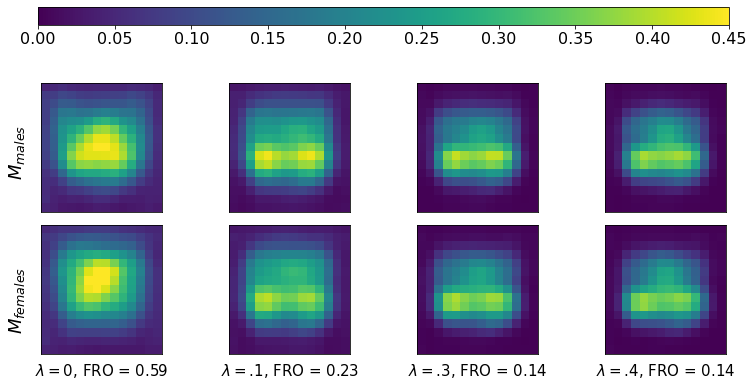

In [ ]:
plot_constraintGeneralPopAttentMaps('classical', regs=["0","d1",".3","d4"])

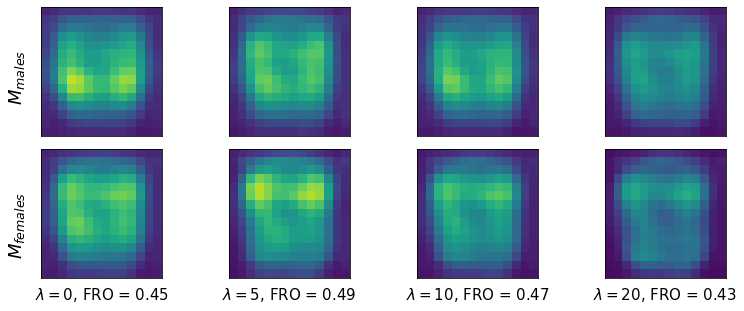

In [ ]:
plot_constraintGeneralPopAttentMaps('crypt', regs=["0","5","10","20"])

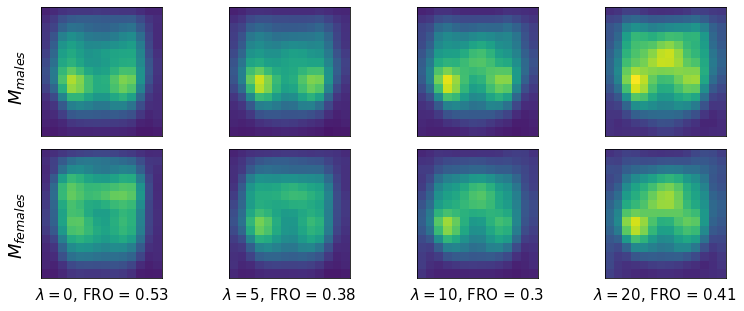

In [ ]:
plot_constraintGeneralPopAttentMaps('plain', regs=["0","5","10","20"])

# Dimensionality Reduction

In [ ]:
# General purpose
import numpy as np
import matplotlib.pyplot as plt
import torch
import pandas as pd

%matplotlib inline

# User defined
import datasets as ds
import cryptUtilities as cu
import camModels as cm
import plotUtilities as pu
import trainUtilities as tu

## Extract

In [ ]:
from torchvision import transforms  # pytorch library for vision


sensible_attr = "gender_coded" # "race_binaryBlackWhite[-1,0,1]" # "gender_coded" # Sensible feature: gender {0:male, 1:female} (exact name of the dataset column)
output_attr = "age_binary30" # Binary classification (exact name of the dataset column)

reduced = 0

ts_set = ds.StoredImageBytesDataset(
    filePath="data/datasets/FairFace/FairFace_test.parquet",
    output_feature=output_attr,
    sensible_feature=sensible_attr,
    reduced=reduced)

from torch.utils.data import DataLoader

params = {"batch_size": 200,    # Size of the image batches (stochastic gradient)
          "num_workers": 0,     # parallelisation of batch creation, 0: None
          "shuffle": True,      # Shuffle before dividing in batches
          "drop_last": True,    # Drop last batch (possibly with fewer images than the selected size)
          "collate_fn": ds.collateCleanNone}

valid_loader = DataLoader(ts_set, **params)

### new

In [ ]:
from tqdm import tqdm
from sklearn.manifold import TSNE

def extractAndSave_reduced_features(trained_model, dataset_loader, start_feat_dimensionality, torch_device,
                                    dimensionality_reducer, save_file, folder):
    
    tensors_feat = torch.empty(0, start_feat_dimensionality, device=torch_device)
    tensors_sens, tensors_labl = torch.empty(0, dtype=int), torch.empty(0, dtype=int)

    for (imgs, sens), labl in tqdm(dataset_loader):
        feats = trained_model.features(imgs.to(torch_device))
        feats = trained_model.fc[:2](feats)

        tensors_feat = torch.cat((tensors_feat, feats))
        tensors_sens = torch.cat((tensors_sens, sens))
        tensors_labl = torch.cat((tensors_labl, labl))

    features = tensors_feat.detach().cpu().numpy()
    sensitives = tensors_sens.numpy()
    labels = tensors_labl.numpy()

    # features = (features-features.mean(axis=0))/features.std(axis=0)
    # features /= np.linalg.norm(features, ord=2, axis=0) 
    # features = (features-features.min(axis=0))/(features.max(axis=0)-features.min(axis=0))

    # for i in range(start_feat_dimensionality):
        # f_mean, f_std = features[:,i].mean(), features[:,i].std()
        # features[:,i] -= f_mean
        # if f_std!=0: features[:,i] /= f_std

        # f_norm = np.linalg.norm(features[:,i], ord=2)
        # if f_norm!=0: features[:,i] /= f_norm
        
        # f_min, f_max = features[:,i].min(), features[:,i].max()
        # features[:,i] -= f_min
        # if f_min!=f_max: features[:,i] /= (f_max-f_min)
        
    # for i in range(len(features)):
        # r_mean, r_std = features[i].mean(), features[i].std()
        # features[i] -= r_mean
        # if r_std!=0: features[i] /= r_std
    
    #print(f"\nStarting final reduction:\t{dimensionality_reducer}")
    reduced_feats = dimensionality_reducer.fit_transform(X=features, y=labels)

    np.save(f"data/results/dim_reduction/FOM_{folder}/{save_file}_reducedFeats.npy", reduced_feats)
    np.save(f"data/results/dim_reduction/FOM_{folder}/{save_file}_sensitives.npy", sensitives)
    np.save(f"data/results/dim_reduction/FOM_{folder}/{save_file}_labels.npy", labels)
    

#### crypt

In [ ]:
use_cuda = True     # enables computations over GPU
t_device = torch.device("cuda" if use_cuda and torch.cuda.is_available() else "cpu")

dim_out = len(ts_set.output_normMapping.keys()) #1
feature_red = 32
hidden_card = 16

pretrained = True               # Use a pretrained version
embedd_active_grad = False      # Deactivate gradient propagation inside the convolution layers (referred to as "features")
sigm_activ = False              # Dense layer activation function: {True: sigmoid, False: square}
                               
model_name = "vggface"          # Model name: "alexnet","vgg11","vgg13","vgg16","vgg19","vggface","resnet50","inceptionresnet"
hiddens = [hidden_card]         # Fully connected layers depth and width: 
                                # e.g. [100,10] means features -> 100 neurons -> 10 neurons -> output dim


for reg in [10]: # [0,10,15,20]:

    ft_model = cu.Adapted_fullyConn_classifier(
        dim_out=dim_out, hiddens=hiddens, model_name=model_name,
        req_grad=embedd_active_grad,
        pretrained=pretrained, sigm_activ=sigm_activ,
        feature_reduction=feature_red).to(t_device)

    ft_model.load_neuralNet_full(
        torch_device=t_device,
        name_extension='_squareDenseNet_reduced25k-32(16hidden)_noReg_biased9010',
        root_folder='featureExtraction_models/fairfaceEmbedding_extraction/')

    ft_model.load_finalLayers(reg=reg, lr=.02, torch_device=t_device, folder='crypt')

    for metric in ["manhattan"]: #["euclidean","manhattan"]:
        
        for perp in [5]: #[5,10,15,17,20]:

            s_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init=pca"

            tsne = TSNE(n_components=2, verbose=0, metric=metric, init="pca", # "random"
                        perplexity=perp, n_iter=3000, learning_rate=200.0)

            extractAndSave_reduced_features(
                trained_model=ft_model, dataset_loader=valid_loader,
                start_feat_dimensionality=16, torch_device=t_device,
                dimensionality_reducer=tsne, save_file=s_f, folder='crypt')


  0%|          | 0/54 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
100%|██████████| 54/54 [01:01<00:00,  1.13s/it]


#### plain

In [ ]:
use_cuda = True     # enables computations over GPU
t_device = torch.device("cuda" if use_cuda and torch.cuda.is_available() else "cpu")

dim_out = len(ts_set.output_normMapping.keys()) #1
feature_red = 32
hidden_card = 16

pretrained = True               # Use a pretrained version
embedd_active_grad = False      # Deactivate gradient propagation inside the convolution layers (referred to as "features")
sigm_activ = False              # Dense layer activation function: {True: sigmoid, False: square}
                               
model_name = "vggface"          # Model name: "alexnet","vgg11","vgg13","vgg16","vgg19","vggface","resnet50","inceptionresnet"
hiddens = [hidden_card]         # Fully connected layers depth and width: 
                                # e.g. [100,10] means features -> 100 neurons -> 10 neurons -> output dim


for reg in [10]: # [0,10,15,20]:

    ft_model = cu.Adapted_fullyConn_classifier(
        dim_out=dim_out, hiddens=hiddens, model_name=model_name,
        req_grad=embedd_active_grad,
        pretrained=pretrained, sigm_activ=sigm_activ,
        feature_reduction=feature_red).to(t_device)

    ft_model.load_neuralNet_full(
        torch_device=t_device,
        name_extension='_squareDenseNet_reduced25k-32(16hidden)_noReg_biased9010',
        root_folder='featureExtraction_models/fairfaceEmbedding_extraction/')

    ft_model.load_finalLayers(reg=reg, lr=.05, torch_device=t_device, folder='plain')

    for metric in ["manhattan"]:#["euclidean","manhattan"]:
        
        for perp in [5]: #[5,10,15,17,20]:

            s_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init=pca"

            tsne = TSNE(n_components=2, verbose=0, metric=metric, init="pca", # "random"
                        perplexity=perp, n_iter=3000, learning_rate=200.0)

            extractAndSave_reduced_features(
                trained_model=ft_model, dataset_loader=valid_loader,
                start_feat_dimensionality=16, torch_device=t_device,
                dimensionality_reducer=tsne, save_file=s_f, folder='plain')


100%|██████████| 54/54 [01:05<00:00,  1.22s/it]


### classical

In [ ]:
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression

def extractAndSave_reduced_features(trained_model, dataset_loader, feat_start_dimensionality, torch_device,
                                    dimensionality_reducer, save_file, intermediate_reductors=[]):
    
    tensors_feat = torch.empty(0,feat_start_dimensionality, device=torch_device)
    tensors_sens, tensors_labl = torch.empty(0, dtype=int), torch.empty(0, dtype=int)

    for (imgs, sens), labl in tqdm(dataset_loader):
        feats = trained_model.features(imgs.to(torch_device))
        tensors_feat = torch.cat((tensors_feat, feats))
        tensors_sens = torch.cat((tensors_sens, sens))
        tensors_labl = torch.cat((tensors_labl, labl))

    features = tensors_feat.cpu().numpy()
    sensitives = tensors_sens.numpy()
    labels = tensors_labl.numpy()

    # features = (features-features.mean(axis=0))/features.std(axis=0)
    # features /= np.linalg.norm(features, ord=2, axis=0) 
    # features = (features-features.min(axis=0))/(features.max(axis=0)-features.min(axis=0))

    # for i in range(feat_start_dimensionality):
        # f_mean, f_std = features[:,i].mean(), features[:,i].std()
        # features[:,i] -= f_mean
        # if f_std!=0: features[:,i] /= f_std

        # f_norm = np.linalg.norm(features[:,i], ord=2)
        # if f_norm!=0: features[:,i] /= f_norm
        
        # f_min, f_max = features[:,i].min(), features[:,i].max()
        # features[:,i] -= f_min
        # if f_min!=f_max: features[:,i] /= (f_max-f_min)
        
    # for i in range(len(features)):
        # r_mean, r_std = features[i].mean(), features[i].std()
        # features[i] -= r_mean
        # if r_std!=0: features[i] /= r_std

    for ir in intermediate_reductors:
        print(f"Reducing with:\t{ir}")
        features = ir.fit_transform(X=features, y=labels)

        # for i in range(len(features)):
            # r_mean, r_std = features[i].mean(), features[i].std()
            # features[i] -= r_mean
            # if r_std!=0: features[i] /= r_std
        
        # for i in range(features.shape[1]):
            # f_mean, f_std = features[:,i].mean(), features[:,i].std()
            # features[:,i] -= f_mean
            # if f_std!=0: features[:,i] /= f_std

            # f_norm = np.linalg.norm(features[:,i], ord=2)
            # if f_norm!=0: features[:,i] /= f_norm
            
            # f_min, f_max = features[:,i].min(), features[:,i].max()
            # features[:,i] -= f_min
            # if f_min!=f_max: features[:,i] /= (f_max-f_min)

        # for i in range(len(features)):
            # r_mean, r_std = features[i].mean(), features[i].std()
            # features[i] -= r_mean
            # if r_std!=0: features[i] /= r_std
    
    print(f"\nStarting final reduction:\t{dimensionality_reducer}")
    reduced_feats = dimensionality_reducer.fit_transform(X=features, y=labels)

    np.save(f"data/results/dim_reduction/FOM_classical/{save_file}_reducedFeats.npy", reduced_feats)
    np.save(f"data/results/dim_reduction/FOM_classical/{save_file}_sensitives.npy", sensitives)
    np.save(f"data/results/dim_reduction/FOM_classical/{save_file}_labels.npy", labels)
    

In [ ]:
from sklearn.linear_model import LogisticRegression

class SparseLogisticRegressionTransformer(LogisticRegression):
    def __init__(self, **kwargs):
        super(SparseLogisticRegressionTransformer, self).__init__(penalty="l1", **kwargs)

    def transforms(self, X):
        return X[:, self.coef_.squeeze()!=0]
        
    def fit_transform(self, X, y):
        self.fit(X,y)
        return self.transforms(X)

In [ ]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import neuroNets as mnn

metric = "manhattan"

r_folder, perp = "sex/", 20

for name_ext, reg in zip(["_FOM_layer=0_lambda=d3"],["d3"]): # zip((["_noReg","_FOM_layer=0_lambda=d2","_FOM_layer=0_lambda=d3"],["0","d2","d3"])):

    inter_reduct = [SparseLogisticRegressionTransformer(C=.22, solver="liblinear"),
                    PCA(n_components=50),
                    ]

    tsne = TSNE(n_components=2, verbose=1, metric=metric, init="pca", perplexity=perp, n_iter=3000, learning_rate=200.0)

    use_cuda = True
    t_device = torch.device("cuda" if use_cuda and torch.cuda.is_available() else "cpu")

    ft_model = mnn.Adapted_fullyConn_classifier(dim_out=len(ts_set.output_normMapping.keys()), model_name="vggface", hiddens=[100], pretrained=False).to(t_device)
    ft_model.load_neuralNet_features(name_extension=name_ext, torch_device=t_device, root_folder=r_folder)


    s_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init=pca"

    extractAndSave_reduced_features(trained_model=ft_model, dataset_loader=valid_loader, feat_start_dimensionality=25088, torch_device=t_device,
                                    dimensionality_reducer=tsne, save_file=s_f, intermediate_reductors=inter_reduct)

100%|██████████| 54/54 [01:05<00:00,  1.22s/it]


Reducing with:	SparseLogisticRegressionTransformer()
Reducing with:	PCA(copy=True, iterated_power='auto', n_components=50, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

Starting final reduction:	TSNE(angle=0.5, early_exaggeration=12.0, init='pca', learning_rate=200.0,
     method='barnes_hut', metric='manhattan', min_grad_norm=1e-07,
     n_components=2, n_iter=3000, n_iter_without_progress=300, n_jobs=None,
     perplexity=20, random_state=None, verbose=1)
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 10800 samples in 0.113s...
[t-SNE] Computed neighbors for 10800 samples in 11.150s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10800
[t-SNE] Computed conditional probabilities for sample 2000 / 10800
[t-SNE] Computed conditional probabilities for sample 3000 / 10800
[t-SNE] Computed conditional probabilities for sample 4000 / 10800
[t-SNE] Computed conditional probabilities for sample 5000 / 10800
[t-SNE] Computed conditional probabilit

## Plots

### single

In [ ]:
from itertools import product
import numpy as np
from matplotlib import pyplot as plt
import torch
import trainUtilities as tu

def plot_reducedFeatures(load_file, folder='crypt'):
    labels_colors_markers = {   # labels
                             "s_0":"Males",
                             "s_1":"Females",
                             "l_0":"Age < 30",
                             "l_1":"Age $\geq$ 30",
                            
                                # color codes (sensitive,label) or (label)
                             "c_0,0":"#d7191c","c_0,1":"#fdae61", 
                             "c_1,0":"#2c7bb6","c_1,1":"#abd9e9",
                             "c_0":"#4dac26", "c_1":"#5e3c99",

                                # marker codes (label)
                             "m_0":'o', "m_1":'+',
                            }

    reduced_feats = np.load(f"data/results/dim_reduction/FOM_{folder}/{load_file}_reducedFeats.npy")
    labels = np.load(f"data/results/dim_reduction/FOM_{folder}/{load_file}_labels.npy")
    sensitives = np.load(f"data/results/dim_reduction/FOM_{folder}/{load_file}_sensitives.npy")

    if len(reduced_feats)>5000:
        idxs = np.random.permutation(range(5000))
        reduced_feats = reduced_feats[idxs]
        labels = labels[idxs]
        sensitives = sensitives[idxs]

    fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20,14), gridspec_kw={'hspace':0,'wspace':0, 'height_ratios': [1,.2,.2,1,.2], "width_ratios":[.15,1,.15,.15,1]})
    
    plt.setp(axs, xticks=[], yticks=[])

    for x,y in product([1,4],[0,3]):
        axs[x,y].axis('off')
    for ax in axs[:,2]:
        ax.axis('off')
    for ax in axs[2,:]:
        ax.axis('off')

    distributions = {}
    
    for l in np.unique(labels):
        idxs = labels==l

        distributions[f"label{l}"] = torch.tensor(reduced_feats[idxs])

        axs[0,1].plot(reduced_feats[idxs,0], reduced_feats[idxs,1], labels_colors_markers[f"m_{l}"], c=labels_colors_markers[f"c_{l}"],
                      markerfacecolor='none', label=labels_colors_markers[f"l_{l}"])
        
        y, bins, = np.histogram(reduced_feats[idxs, 0])
        centers = bins[:-1] + np.diff(bins) / 2
        axs[1,1].step(bins[:-1], y, where='post', c=labels_colors_markers[f'c_{l}'], alpha=.3)
        axs[1,1].plot(centers, y, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{l}"], markerfacecolor='none')
        
        y, bins, = np.histogram(reduced_feats[idxs, 1])
        centers = bins[:-1] + np.diff(bins) / 2
        axs[0,0].step(y, bins[:-1], c=labels_colors_markers[f'c_{l}'], alpha=.3)
        axs[0,0].plot(y, centers, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{l}"], markerfacecolor='none')

        for s in np.unique(sensitives):
            idxs = (labels==l) & (sensitives==s)

            distributions[f"label{l}_sensitive{s}"] = torch.tensor(reduced_feats[idxs])

            axs[l*3,l+4*abs(l-1)].plot(reduced_feats[idxs,0], reduced_feats[idxs,1], labels_colors_markers[f"m_{l}"], c=labels_colors_markers[f"c_{s},{l}"],
                            markerfacecolor="none", label=f"{labels_colors_markers[f's_{s}']}, {labels_colors_markers[f'l_{l}']}")
            
            y, bins, = np.histogram(reduced_feats[idxs, 0])
            centers = bins[:-1] + np.diff(bins) / 2
            axs[l*3+1,l+4*abs(l-1)].step(bins[:-1], y, where='post', c=labels_colors_markers[f"c_{s},{l}"], alpha=.5)
            axs[l*3+1,l+4*abs(l-1)].plot(centers, y, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{s},{l}"], markerfacecolor='none')

            y, bins, = np.histogram(reduced_feats[idxs, 1])
            centers = bins[:-1] + np.diff(bins) / 2
            axs[l*3,l+4*abs(l-1)-1].step(y, bins[:-1], c=labels_colors_markers[f"c_{s},{l}"], alpha=.5)
            axs[l*3,l+4*abs(l-1)-1].plot(y, centers, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{s},{l}"], markerfacecolor='none')
            
            
            axs[3,4].plot(reduced_feats[idxs,0], reduced_feats[idxs,1], labels_colors_markers[f"m_{l}"], c=labels_colors_markers[f"c_{s},{l}"],
                          markerfacecolor="none", label=f"{labels_colors_markers[f's_{s}']}, {labels_colors_markers[f'l_{l}']}")
            
            y, bins, = np.histogram(reduced_feats[idxs, 0])
            centers = bins[:-1] + np.diff(bins) / 2
            axs[4,4].step(bins[:-1], y, where='post', c=labels_colors_markers[f"c_{s},{l}"], alpha=.5)
            axs[4,4].plot(centers, y, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{s},{l}"], markerfacecolor='none')

            y, bins, = np.histogram(reduced_feats[idxs, 1])
            centers = bins[:-1] + np.diff(bins) / 2
            axs[3,3].step(y, bins[:-1], c=labels_colors_markers[f"c_{s},{l}"], alpha=.3)
            axs[3,3].plot(y, centers, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{s},{l}"], markerfacecolor='none')


    for x,y in product([0,3],[1,4]): axs[x,y].legend()
    axs[0,1].set_title("General Cumulative", fontsize=25); axs[0,4].set_title("Focus on Young", fontsize=25);
    axs[3,1].set_title("Focus on Old", fontsize=25); axs[3,4].set_title("Cumulative with Sensitive", fontsize=25);

    axs[1,0].text(.2,.2, f"MMD:\n{round(tu.gauss_maximum_mean_discrepancy(distributions['label0'],distributions['label1'] , gamma=.0001).item(), 3)}", size=15)
    axs[1,3].text(.2,.2, f"MMD:\n{round(tu.gauss_maximum_mean_discrepancy(distributions['label0_sensitive0'],distributions['label0_sensitive1'] , gamma=.0001).item(), 3)}", size=15)
    axs[4,0].text(.2,.2, f"MMD:\n{round(tu.gauss_maximum_mean_discrepancy(distributions['label1_sensitive0'],distributions['label1_sensitive1'] , gamma=.0001).item(), 3)}", size=15)

#### crypted

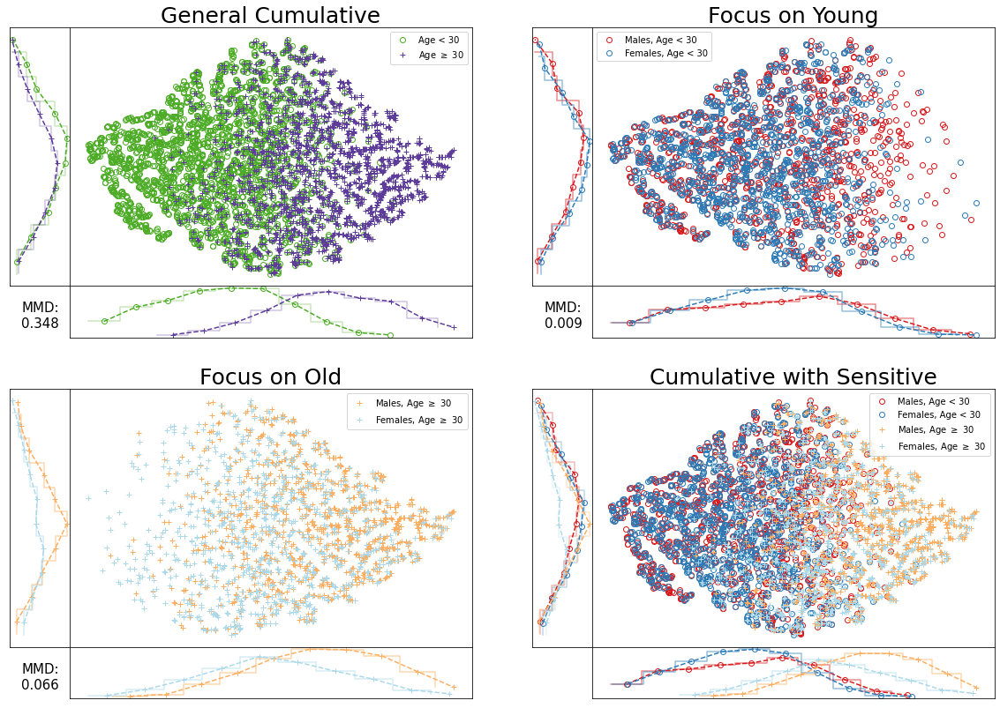

In [ ]:
metric = "manhattan"
# metric = "euclidean"

reg = 0
perp = 5 #5,20,40
init = 'pca' # 'random'

l_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init={init}"

plot_reducedFeatures(l_f, folder='crypt')

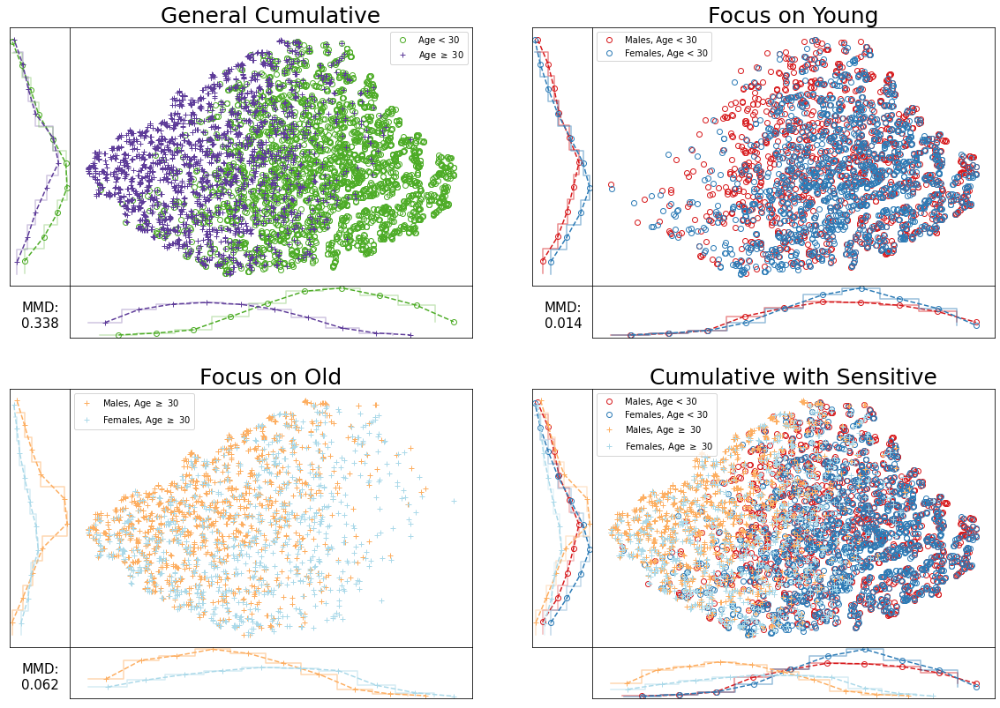

In [ ]:
metric = "manhattan"
# metric = "euclidean"

reg = 10
perp = 5 #5,20,40
init = 'pca' # 'random'

l_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init={init}"

plot_reducedFeatures(l_f, folder='crypt')

#### plain

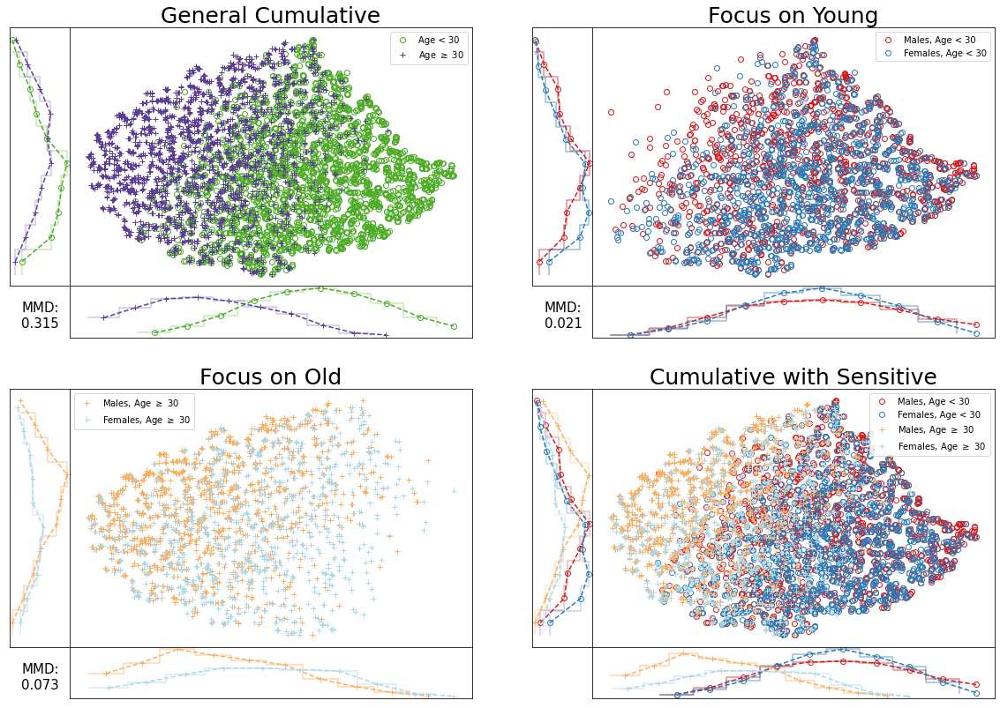

In [ ]:
metric = "manhattan"
# metric = "euclidean"

reg = 0
perp = 5 #5,20,40
init = 'pca' # 'random'

l_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init={init}"

plot_reducedFeatures(l_f, folder='plain')

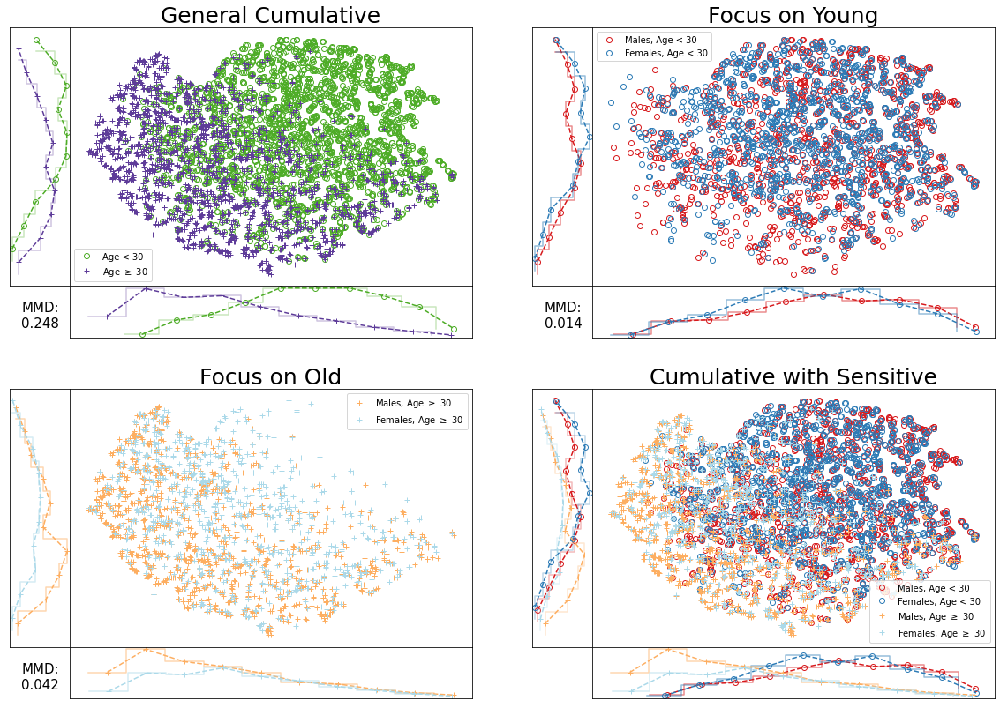

In [ ]:
metric = "manhattan"
# metric = "euclidean"

reg = 10
perp = 5 #5,20,40
init = 'pca' # 'random'

l_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init={init}"

plot_reducedFeatures(l_f, folder='plain')

#### classical

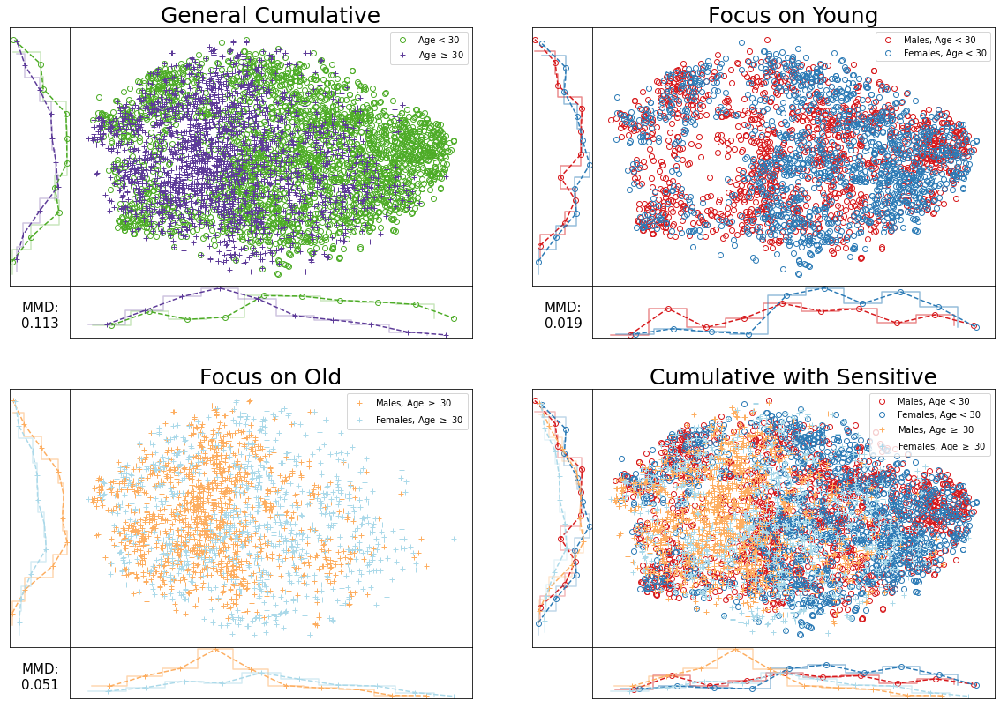

In [ ]:
metric = "manhattan"
# metric = "euclidean"

reg = 0
perp = 20
init = 'pca' # 'random'

l_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init={init}"

plot_reducedFeatures(l_f, folder='classical')

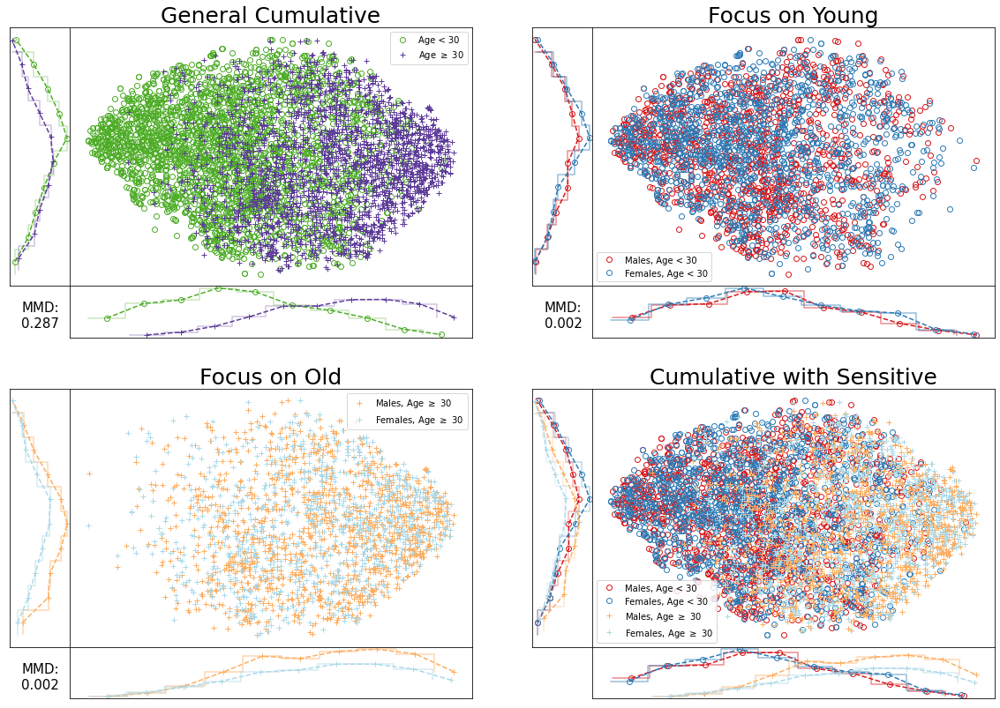

In [ ]:
metric = "manhattan"
# metric = "euclidean"

reg = "d3"
perp = 20
init = 'pca' # 'random'

l_f = f"lambda={reg}_tsne_{metric}_perp{perp}_init={init}"

plot_reducedFeatures(l_f, folder='classical')

### Comparison

In [ ]:
from __future__ import division
import numpy as np
from numpy import random
from scipy.spatial.distance import pdist, cdist
from scipy.stats import kstwobign, pearsonr
from scipy.stats import genextreme

__all__ = ['ks2d2s', 'estat', 'estat2d']


def ks2d2s(x1, y1, x2, y2, nboot=None, extra=False):
    '''Two-dimensional Kolmogorov-Smirnov test on two samples. 
    Parameters
    ----------
    x1, y1 : ndarray, shape (n1, )
        Data of sample 1.
    x2, y2 : ndarray, shape (n2, )
        Data of sample 2. Size of two samples can be different.
    extra: bool, optional
        If True, KS statistic is also returned. Default is False.
    Returns
    -------
    p : float
        Two-tailed p-value.
    D : float, optional
        KS statistic. Returned if keyword `extra` is True.
    Notes
    -----
    This is the two-sided K-S test. Small p-values means that the two samples are significantly different. Note that the p-value is only an approximation as the analytic distribution is unkonwn. The approximation is accurate enough when N > ~20 and p-value < ~0.20 or so. When p-value > 0.20, the value may not be accurate, but it certainly implies that the two samples are not significantly different. (cf. Press 2007)
    References
    ----------
    Peacock, J.A. 1983, Two-Dimensional Goodness-of-Fit Testing in Astronomy, Monthly Notices of the Royal Astronomical Society, vol. 202, pp. 615-627
    Fasano, G. and Franceschini, A. 1987, A Multidimensional Version of the Kolmogorov-Smirnov Test, Monthly Notices of the Royal Astronomical Society, vol. 225, pp. 155-170
    Press, W.H. et al. 2007, Numerical Recipes, section 14.8
    '''
    assert (len(x1) == len(y1)) and (len(x2) == len(y2))
    n1, n2 = len(x1), len(x2)
    D = avgmaxdist(x1, y1, x2, y2)

    if nboot is None:
        sqen = np.sqrt(n1 * n2 / (n1 + n2))
        r1 = pearsonr(x1, y1)[0]
        r2 = pearsonr(x2, y2)[0]
        r = np.sqrt(1 - 0.5 * (r1**2 + r2**2))
        d = D * sqen / (1 + r * (0.25 - 0.75 / sqen))
        p = kstwobign.sf(d)
    else:
        n = n1 + n2
        x = np.concatenate([x1, x2])
        y = np.concatenate([y1, y2])
        d = np.empty(nboot, 'f')
        for i in range(nboot):
            idx = random.choice(n, n, replace=True)
            ix1, ix2 = idx[:n1], idx[n1:]
            #ix1 = random.choice(n, n1, replace=True)
            #ix2 = random.choice(n, n2, replace=True)
            d[i] = avgmaxdist(x[ix1], y[ix1], x[ix2], y[ix2])
        p = np.sum(d > D).astype('f') / nboot
    if extra:
        return p, D
    else:
        return p


def avgmaxdist(x1, y1, x2, y2):
    D1 = maxdist(x1, y1, x2, y2)
    D2 = maxdist(x2, y2, x1, y1)
    return (D1 + D2) / 2


def maxdist(x1, y1, x2, y2):
    n1 = len(x1)
    D1 = np.empty((n1, 4))
    for i in range(n1):
        a1, b1, c1, d1 = quadct(x1[i], y1[i], x1, y1)
        a2, b2, c2, d2 = quadct(x1[i], y1[i], x2, y2)
        D1[i] = [a1 - a2, b1 - b2, c1 - c2, d1 - d2]

    # re-assign the point to maximize difference,
    # the discrepancy is significant for N < ~50
    D1[:, 0] -= 1 / n1

    dmin, dmax = -D1.min(), D1.max() + 1 / n1
    return max(dmin, dmax)


def quadct(x, y, xx, yy):
    n = len(xx)
    ix1, ix2 = xx <= x, yy <= y
    a = np.sum(ix1 & ix2) / n
    b = np.sum(ix1 & ~ix2) / n
    c = np.sum(~ix1 & ix2) / n
    d = 1 - a - b - c
    return a, b, c, d


def estat2d(x1, y1, x2, y2, **kwds):
    return estat(np.c_[x1, y1], np.c_[x2, y2], **kwds)


def estat(x, y, nboot=1000, replace=False, method='log', fitting=False):
    '''
    Energy distance statistics test.
    Reference
    ---------
    Aslan, B, Zech, G (2005) Statistical energy as a tool for binning-free
      multivariate goodness-of-fit tests, two-sample comparison and unfolding.
      Nuc Instr and Meth in Phys Res A 537: 626-636
    Szekely, G, Rizzo, M (2014) Energy statistics: A class of statistics
      based on distances. J Stat Planning & Infer 143: 1249-1272
    Brian Lau, multdist, https://github.com/brian-lau/multdist
    '''
    n, N = len(x), len(x) + len(y)
    stack = np.vstack([x, y])
    stack = (stack - stack.mean(0)) / stack.std(0)
    if replace:
        rand = lambda x: random.randint(x, size=x)
    else:
        rand = random.permutation

    en = energy(stack[:n], stack[n:], method)
    en_boot = np.zeros(nboot, 'f')
    for i in range(nboot):
        idx = rand(N)
        en_boot[i] = energy(stack[idx[:n]], stack[idx[n:]], method)

    if fitting:
        param = genextreme.fit(en_boot)
        p = genextreme.sf(en, *param)
        return p, en, param
    else:
        p = (en_boot >= en).sum() / nboot
        return p, en, en_boot


def energy(x, y, method='log'):
    dx, dy, dxy = pdist(x), pdist(y), cdist(x, y)
    n, m = len(x), len(y)
    if method == 'log':
        dx, dy, dxy = np.log(dx), np.log(dy), np.log(dxy)
    elif method == 'gaussian':
        raise NotImplementedError
    elif method == 'linear':
        pass
    else:
        raise ValueError
    z = dxy.sum() / (n * m) - dx.sum() / n**2 - dy.sum() / m**2
    # z = ((n*m)/(n+m)) * z # ref. SR
    return z

In [ ]:
from itertools import product
import numpy as np
from matplotlib import pyplot as plt
import torch
import trainUtilities as tu
from scoreUtilities import max_cdfDDP

def plot_reducedFeatures_comparison(load_files, folder='crypt'):
    labels_colors_markers = {   # labels
                             "s_0":"Males",
                             "s_1":"Females",
                             "l_0":"Age < 30",
                             "l_1":"Age $\geq$ 30",
                            
                                # color codes (sensitive,label) or (label)
                             "c_0,0":"#fc8d59","c_0,1":"#91bfdb", 
                             "c_1,0":"#d73027","c_1,1":"#4575b4",
                             "c_0":"#762a83", "c_1":"#4d9221",

                                # marker codes (label)
                             "m_0":'o', "m_1":'X',
                            }

    fig, axs = plt.subplots(nrows=5, ncols=11, figsize=(35,13), gridspec_kw={'hspace':0,'wspace':0, 'height_ratios': [1,.2,.3,1,.2], "width_ratios":[.15,1,.1,.15,1,.15,.15,1,.1,.15,1]})
    
    plt.setp(axs, xticks=[], yticks=[])

    for x,y in product([1,4],[0,3,6,9]): axs[x,y].axis('off')
    
    for ax in axs[2,:]:
        ax.axis('off')
    for i in [2,5,8]:
        for ax in axs[:,i]: ax.axis('off')

    distributions = {}

    for reg_idx, l_f in enumerate(load_files):

        reduced_feats = np.load(f"data/results/dim_reduction/FOM_{folder}/{l_f}_reducedFeats.npy")
        labels = np.load(f"data/results/dim_reduction/FOM_{folder}/{l_f}_labels.npy")
        sensitives = np.load(f"data/results/dim_reduction/FOM_{folder}/{l_f}_sensitives.npy")

        if len(reduced_feats)>5000:
            idxs = np.random.permutation(range(5000))
            reduced_feats = reduced_feats[idxs]
            labels = labels[idxs]
            sensitives = sensitives[idxs]

        for l in np.unique(labels):
            idxs = labels==l

            distributions[f"label{l}"] = torch.tensor(reduced_feats[idxs])

            axs[0,1+reg_idx*3].plot(reduced_feats[idxs,0], reduced_feats[idxs,1], labels_colors_markers[f"m_{l}"], c=labels_colors_markers[f"c_{l}"],
                        markerfacecolor='none')
            
            y, bins, = np.histogram(reduced_feats[idxs, 0])
            centers = bins[:-1] + np.diff(bins) / 2
            axs[1,1+reg_idx*3].step(bins[:-1], y, where='post', c=labels_colors_markers[f'c_{l}'], alpha=.3)
            axs[1,1+reg_idx*3].plot(centers, y, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{l}"], markerfacecolor='none')
            
            y, bins, = np.histogram(reduced_feats[idxs, 1])
            centers = bins[:-1] + np.diff(bins) / 2
            axs[0,0+reg_idx*3].step(y, bins[:-1], c=labels_colors_markers[f'c_{l}'], alpha=.3)
            axs[0,0+reg_idx*3].plot(y, centers, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{l}"], markerfacecolor='none')

            for s in np.unique(sensitives):
                idxs = (labels==l) & (sensitives==s)

                distributions[f"label{l}_sensitive{s}"] = torch.tensor(reduced_feats[idxs])

                axs[l*3,l+4*abs(l-1)+3-3*l+reg_idx*3].plot(reduced_feats[idxs,0], reduced_feats[idxs,1], labels_colors_markers[f"m_{l}"], c=labels_colors_markers[f"c_{s},{l}"],
                                markerfacecolor="none")
                
                y, bins, = np.histogram(reduced_feats[idxs, 0])
                centers = bins[:-1] + np.diff(bins) / 2
                axs[l*3+1,l+4*abs(l-1)+3-3*l+reg_idx*3].step(bins[:-1], y, where='post', c=labels_colors_markers[f"c_{s},{l}"], alpha=.5)
                axs[l*3+1,l+4*abs(l-1)+3-3*l+reg_idx*3].plot(centers, y, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{s},{l}"], markerfacecolor='none')

                y, bins, = np.histogram(reduced_feats[idxs, 1])
                centers = bins[:-1] + np.diff(bins) / 2
                axs[l*3,l+4*abs(l-1)+2-3*l+reg_idx*3].step(y, bins[:-1], c=labels_colors_markers[f"c_{s},{l}"], alpha=.5)
                axs[l*3,l+4*abs(l-1)+2-3*l+reg_idx*3].plot(y, centers, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{s},{l}"], markerfacecolor='none')
                
                
                axs[3,7+reg_idx*3].plot(reduced_feats[idxs,0], reduced_feats[idxs,1], labels_colors_markers[f"m_{l}"], c=labels_colors_markers[f"c_{s},{l}"],
                            markerfacecolor="none")
                
                y, bins, = np.histogram(reduced_feats[idxs, 0])
                centers = bins[:-1] + np.diff(bins) / 2
                axs[4,7+reg_idx*3].step(bins[:-1], y, where='post', c=labels_colors_markers[f"c_{s},{l}"], alpha=.5)
                axs[4,7+reg_idx*3].plot(centers, y, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{s},{l}"], markerfacecolor='none')

                y, bins, = np.histogram(reduced_feats[idxs, 1])
                centers = bins[:-1] + np.diff(bins) / 2
                axs[3,6+reg_idx*3].step(y, bins[:-1], c=labels_colors_markers[f"c_{s},{l}"], alpha=.3)
                axs[3,6+reg_idx*3].plot(y, centers, f"{labels_colors_markers[f'm_{l}']}--", c=labels_colors_markers[f"c_{s},{l}"], markerfacecolor='none')


        # for x,y in product([0,3], [1,4,7,10]): axs[x,y].legend()

        axs[0,1+reg_idx*3].set_title(f"$\lambda=${l_f.split('_')[0].split('=')[1].replace('d','.')}", fontsize=25, y=-.32)
        axs[0,7+reg_idx*3].set_title(f"$\lambda=${l_f.split('_')[0].split('=')[1].replace('d','.')}", fontsize=25, y=-.32)
        axs[3,1+reg_idx*3].set_title(f"$\lambda=${l_f.split('_')[0].split('=')[1].replace('d','.')}", fontsize=25, y=-.32)
        axs[3,7+reg_idx*3].set_title(f"$\lambda=${l_f.split('_')[0].split('=')[1].replace('d','.')}", fontsize=25, y=-.32)

        # axs[1,0+reg_idx*3].text(0,.25, f"KS:\n{round(max_cdfDDP(distributions['label0'],distributions['label1']), 3)}", size=20)
        # axs[1,6+reg_idx*3].text(0,.25, f"KS:\n{round(max_cdfDDP(distributions['label0_sensitive0'],distributions['label0_sensitive1']), 3)}", size=20)
        # axs[4,0+reg_idx*3].text(0,.25, f"KS:\n{round(max_cdfDDP(distributions['label1_sensitive0'],distributions['label1_sensitive1']), 3)}", size=20)

        distributions = { k:distributions[k].numpy() for k in distributions.keys()}
        axs[1,0+reg_idx*3].text(-0.15,.05, f"KS:\n{round(ks2d2s(distributions['label0'][:,0],distributions['label0'][:,1],distributions['label1'][:,0],distributions['label1'][:,1], extra=True)[1], 3)}", size=23)
        axs[1,6+reg_idx*3].text(-0.15,.05, f"KS:\n{round(ks2d2s(distributions['label0_sensitive0'][:,0],distributions['label0_sensitive0'][:,1],distributions['label0_sensitive1'][:,0],distributions['label0_sensitive1'][:,1], extra=True)[1], 3)}", size=23)
        axs[4,0+reg_idx*3].text(-0.15,.05, f"KS:\n{round(ks2d2s(distributions['label1_sensitive0'][:,0],distributions['label1_sensitive0'][:,1],distributions['label1_sensitive1'][:,0],distributions['label1_sensitive1'][:,1], extra=True)[1], 3)}", size=23)


    axs[0,1].text(80 if folder=="classical" else 140,
                  130 if folder=="classical" else 240, "General Cumulative", fontsize=25)
    axs[0,7].text(160 if folder=='plain' else 100,
                  130 if folder=="classical" else 240, "Focus on Young", fontsize=25)
    axs[3,1].text(110 if folder=="classical" else 110 if folder=='plain' else 190,
                  130 if folder=="classical" else 240, "Focus on Old", fontsize=25)
    axs[3,7].text(50 if folder=="classical" else 100,
                  130 if folder=="classical" else 240, "Cumulative with Sensitive", fontsize=25)


    if folder=='classical':
        hndls = []
        for l in [0,1]:
            hndls.append(axs[3,7].plot([],[],
                                       labels_colors_markers[f"m_{l}"],
                                       label=labels_colors_markers[f"l_{l}"],
                                       color=labels_colors_markers[f"c_{l}"],
                                       markerfacecolor='none')[0])
            for s in [0,1]:
                hndls.append(axs[3,7].plot([],[],
                                           labels_colors_markers[f"m_{l}"],
                                           label=f"{labels_colors_markers[f's_{s}']}, {labels_colors_markers[f'l_{l}']}",
                                           color=labels_colors_markers[f"c_{s},{l}"],
                                           markerfacecolor='none')[0])
                
        axs[3,7].legend(handles=hndls, bbox_to_anchor=(2.1,2.9), ncol=6, fontsize=26, markerscale=3, handletextpad=.1)

#### crypt

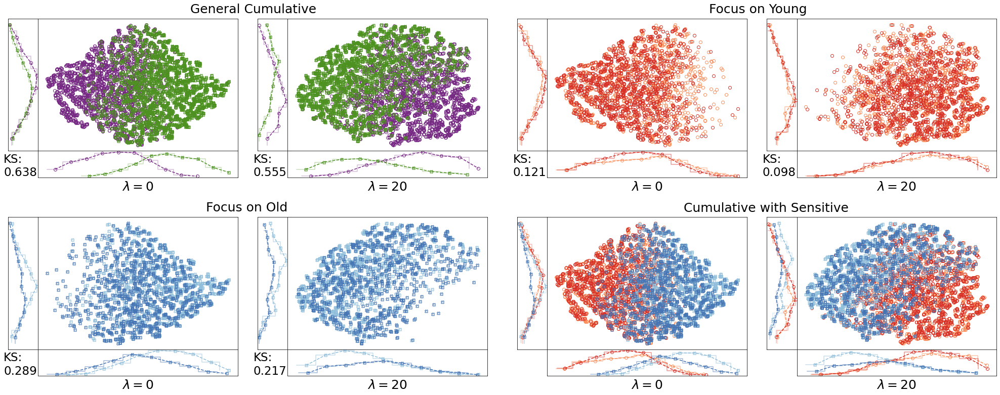

In [ ]:
metric = "manhattan"
# metric = "euclidean"

regs = 0, 20
perp = 5 #5,20,40
init = 'pca' # 'random'

plot_reducedFeatures_comparison([f"lambda={regs[0]}_tsne_{metric}_perp{perp}_init={init}",
                                 f"lambda={regs[1]}_tsne_{metric}_perp{perp}_init={init}"],
                                folder='crypt')

#### plain

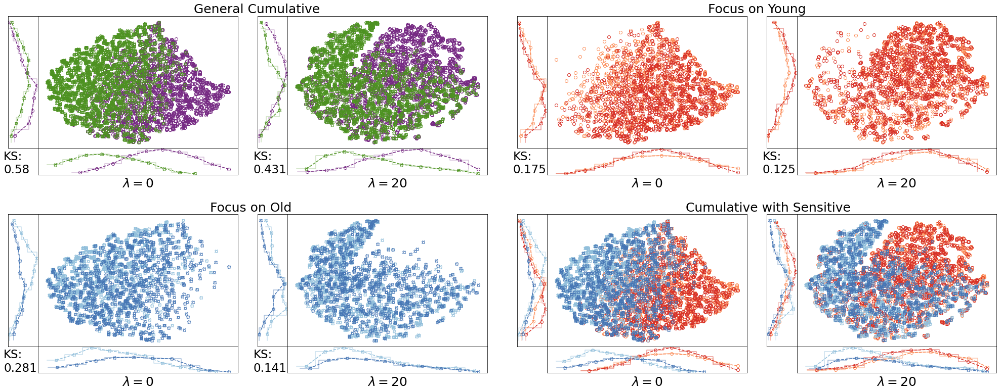

In [ ]:
metric = "manhattan"
# metric = "euclidean"

regs = 0, 20
perp = 5 #5,20,40
init = 'pca' # 'random'

plot_reducedFeatures_comparison([f"lambda={regs[0]}_tsne_{metric}_perp{perp}_init={init}",
                                 f"lambda={regs[1]}_tsne_{metric}_perp{perp}_init={init}"],
                                folder='plain')

#### classical

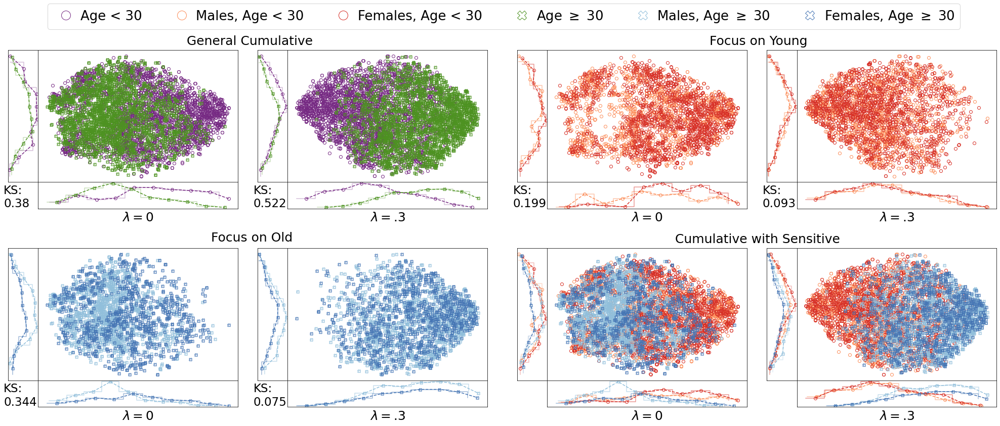

In [ ]:
metric = "manhattan"
# metric = "euclidean"

regs = "0", "d3" 
perp = 20 #5,20,40
init = 'pca' # 'random'

plot_reducedFeatures_comparison([f"lambda={regs[0]}_tsne_{metric}_perp{perp}_init={init}",
                                 f"lambda={regs[1]}_tsne_{metric}_perp{perp}_init={init}"],
                                folder='classical')